In [1]:
%matplotlib inline
import argparse
import csv
import logging
import os
import random
import sys
import pickle
import time
import numpy as np
from termcolor import colored
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from bert_util import *
import glob
from scipy import stats
from nltk.tokenize import RegexpTokenizer
from nltk.tokenize import TweetTokenizer

In [2]:
def lexical_overlap_rate(premise, hypothesis):
    premise_token_list = tokenizer.tokenize(premise.lower())
    hypothesis_token_list = tokenizer.tokenize(hypothesis.lower())
    overlap_cnt = 0
    for tok in hypothesis_token_list:
        if tok in premise_token_list:
            overlap_cnt += 1
    return 1.0 * overlap_cnt / len(hypothesis_token_list)

In [3]:
def negation_rate(premise, hypothesis):
    neg_token_list = ['not', 't', 'no', 'never']
    premise_token_list = tokenizer.tokenize(premise.lower())
    hypothesis_token_list = tokenizer.tokenize(hypothesis.lower())
    p_neg_cnt = 0
    for tok in premise_token_list:
        if tok in neg_token_list:
            p_neg_cnt += 1
    h_neg_cnt = 0
    for tok in hypothesis_token_list:
        if tok in neg_token_list:
            h_neg_cnt += 1
    if p_neg_cnt > 0 and h_neg_cnt > 0:
        return 1.0
    elif p_neg_cnt == 0 and h_neg_cnt == 0:
        return 0.0
    else:
        return 1.0

In [4]:
def heuristic_effect_analysis(NLI_dir, test_examples, h='lexical_overlap', bs=1, label_restriction=None):
    total_agg_inf_list = []
    total_agg_lor_list = []
    
    for fn in list(glob.glob(NLI_dir + 'influences_test_*.pkl')):
        influences = pickle.load(open(fn, 'rb'))
        influences = stats.zscore(influences)
        test_idx = int(fn[len(NLI_dir + 'influences_test_'):-len('.pkl')])
        print(test_idx)
        
        test_tok_sal_list, train_tok_sal_lists, test_pred_status = pickle.load(open(NLI_dir + "saliency_test_" + str(test_idx) + ".pkl", "rb"))
        for te in test_examples:
            if te.guid == test_idx:
                break

        if test_pred_status == 'correct':
            test_pred_label = te.label
        else:
            if te.label == 'entailment':
                test_pred_label = 'non-entailment'
            elif te.label == 'non-entailment':
                test_pred_label = 'entailment'
            else:
                raise ValueError("Check label set.")
                
        correct_label = te.label
        
        if label_restriction == None:
            pass
        elif label_restriction not in ["pred_label_entailment", "pred_label_non-entailment", "correct_label_entailment", "correct_label_non-entailment"]:
            raise ValueError("Check label restriction set.")
        elif label_restriction == "pred_label_entailment" and test_pred_label != 'entailment':
            continue
        elif label_restriction == "pred_label_non-entailment" and test_pred_label != 'non-entailment':
            continue
        elif label_restriction == "correct_label_entailment" and correct_label != "entailment":
            continue
        elif label_restriction == "correct_label_non-entailment" and correct_label != "non-entailment":
            continue
        
        print(colored(te.text_a, "blue"), colored(te.text_b, "red"))
        print("prediction:", test_pred_label, ", answer:", correct_label)
        
        train_idx_sorted = list(np.argsort(influences))
        influence_heuristic_list = []
        for idx in train_idx_sorted:
            te = train_examples[idx]
            if h == 'lexical_overlap':
                influence_heuristic_list.append((influences[idx], lexical_overlap_rate(te.text_a, te.text_b)))
            elif h == 'negation':
                influence_heuristic_list.append((influences[idx], negation_rate(te.text_a, te.text_b)))
            else:
                raise ValueError(h + " not implemented yet.")
        
        bucket_size = bs
        inf_bucket = []
        lor_bucket = []
        agg_inf_list = []
        agg_lor_list = []
        for _i, (inf, lor) in enumerate(influence_heuristic_list):
            if _i % bucket_size == 0:
                if len(inf_bucket) > 0:
                    agg_inf_list.append(np.mean(inf_bucket))
                    agg_lor_list.append(np.mean(lor_bucket))
                inf_bucket = []
                lor_bucket = []
            inf_bucket.append(inf)
            lor_bucket.append(lor)
        if len(inf_bucket) > 0:
            agg_inf_list.append(np.mean(inf_bucket))
            agg_lor_list.append(np.mean(lor_bucket))
            
        total_agg_inf_list.extend(agg_inf_list)
        total_agg_lor_list.extend(agg_lor_list)
            
        with sns.plotting_context("notebook", font_scale=1.8):
            if h == 'lexical_overlap':
                ax = sns.regplot(x=agg_inf_list, y=agg_lor_list, order=2, ci=68, color=sns.xkcd_rgb["darkish blue"], line_kws={'color':sns.xkcd_rgb["sky blue"]})
            elif h == 'negation':
                ax = sns.regplot(x=agg_inf_list, y=agg_lor_list, order=2, ci=68, color=sns.xkcd_rgb["brick red"], line_kws={'color':sns.xkcd_rgb["burnt orange"]})
        ax.set_xlabel('influence score')
        if h == 'lexical_overlap':
            ax.set_ylabel('lexical overlap rate')
        elif h == 'negation':
            ax.set_ylabel('negation rate')
        plt.show()
        np_polyfit_result = np.polyfit(agg_inf_list, agg_lor_list, 2)
        print(np_polyfit_result)
        
    with sns.plotting_context("notebook", font_scale=1.8):
        ax = sns.regplot(x=total_agg_inf_list, y=total_agg_lor_list, order=2, ci=68, line_kws={'color':'cyan'})
    ax.set_title('OVERALL')
    ax.set_xlabel('influence score')
    if h == 'lexical_overlap':
        ax.set_ylabel('lexical overlap rate')
    elif h == 'negation':
        ax.set_ylabel('negation rate')
    plt.show()
    print(np.polyfit(total_agg_inf_list, total_agg_lor_list, 2))

In [5]:
NLI_influence_dir = "from_aws/NLI_influence_output_bert_e3/"

In [6]:
mnli_processor = MnliProcessor()
hans_processor = HansProcessor()
train_examples = mnli_processor.get_train_examples('data/', 10000)
test_examples = hans_processor.get_test_examples('data/')
tokenizer = RegexpTokenizer(r'\w+')
tweet_tokenizer = TweetTokenizer()

30
Definitely the artists mentioned the professor . The artists mentioned the professor .
prediction: entailment , answer: entailment


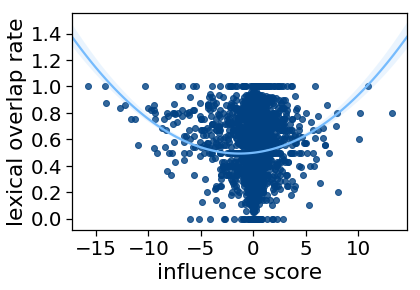

[0.00347125 0.00918112 0.49817694]
9
The actors recognized the lawyer and the professor . The actors recognized the professor .
prediction: non-entailment , answer: entailment


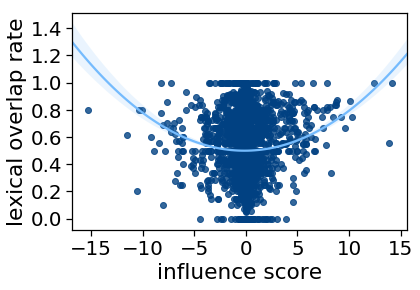

[0.002868   0.00076924 0.49878018]
28
The athlete remembered that the artist introduced the doctor . The artist introduced the doctor .
prediction: entailment , answer: entailment


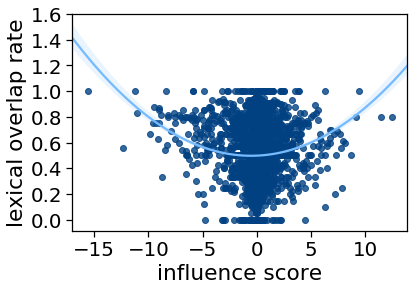

[0.0033784  0.00361492 0.49826979]
7
The athlete by the doctors encouraged the senator . The athlete encouraged the senator .
prediction: entailment , answer: entailment


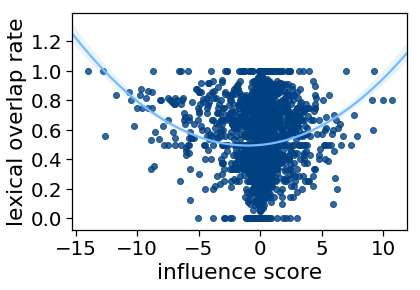

[0.00373619 0.00774825 0.497912  ]
22
If the secretary helped the tourists , the student contacted the lawyers . The student contacted the lawyers .
prediction: entailment , answer: non-entailment


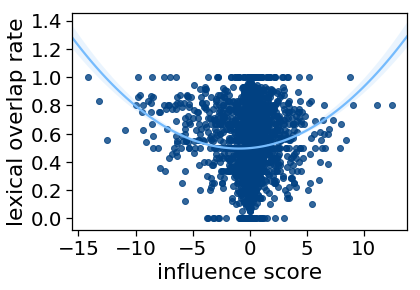

[0.00367604 0.00680741 0.49797215]
6
The tourist who the banker contacted called the lawyers . The banker contacted the tourist .
prediction: entailment , answer: entailment


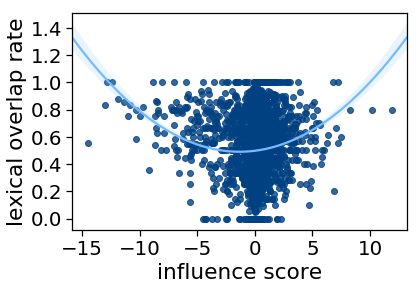

[0.00397507 0.01059446 0.49767311]
3
The actors who recommended the senators called the artists . The artists called the senators .
prediction: entailment , answer: non-entailment


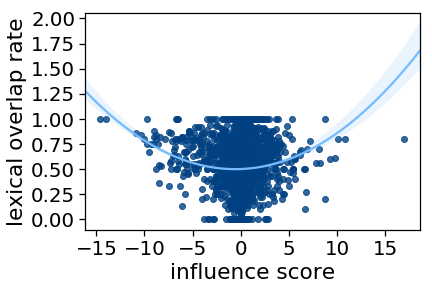

[0.00321025 0.00369257 0.49843794]
10
The manager was encouraged by the secretary . The secretary encouraged the manager .
prediction: entailment , answer: entailment


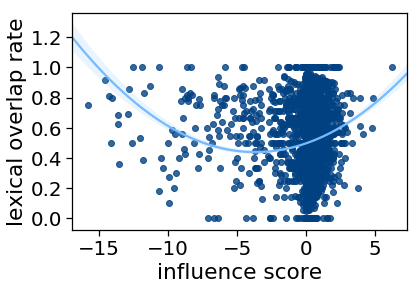

[0.0043231  0.03180723 0.49732509]
4
The banker was encouraged by the athletes . The banker encouraged the athletes .
prediction: entailment , answer: non-entailment


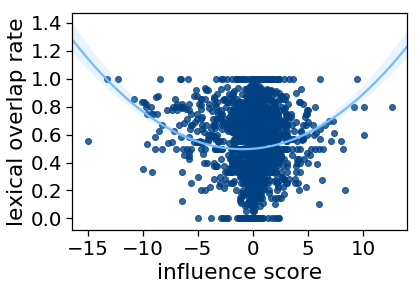

[0.00329202 0.00628362 0.49835617]
26
While the scientists saw the tourists , the artist resigned . The scientists saw the tourists .
prediction: entailment , answer: entailment


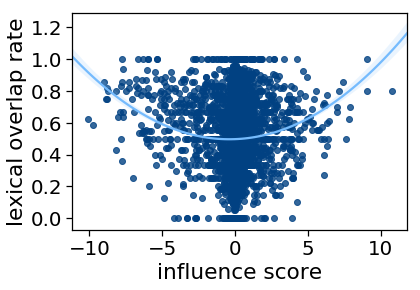

[0.00448712 0.00359766 0.49716107]
5
The scientist and the student called the athlete . The student called the scientist .
prediction: entailment , answer: non-entailment


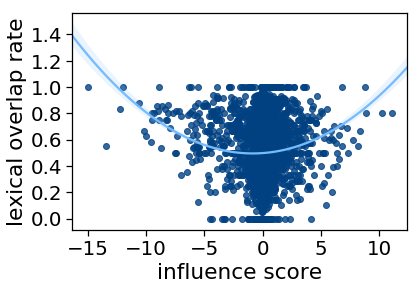

[0.00373417 0.00627652 0.49791402]
17
Important athletes arrived . Athletes arrived .
prediction: entailment , answer: entailment


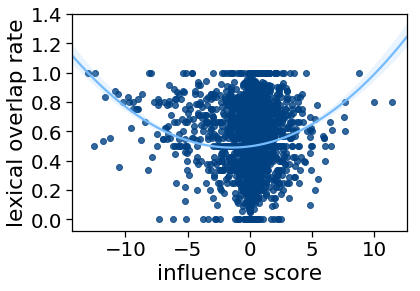

[0.00380808 0.01101827 0.49784011]
14
The scientist presented in the museum contacted the secretaries . The scientist presented in the museum .
prediction: entailment , answer: non-entailment


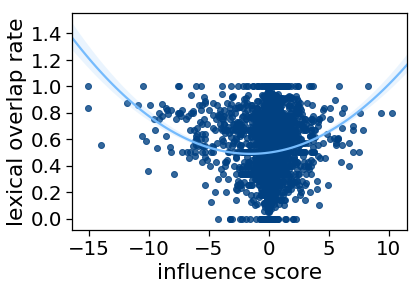

[0.00395856 0.0118481  0.49768962]
18
The lawyer won the tournament . The lawyer won .
prediction: entailment , answer: entailment


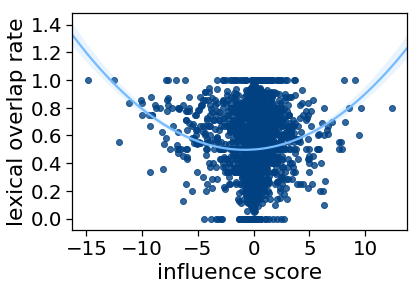

[0.00346747 0.00548899 0.49818072]
16
The students and the secretaries mentioned the doctor . The secretaries mentioned the doctor .
prediction: entailment , answer: entailment


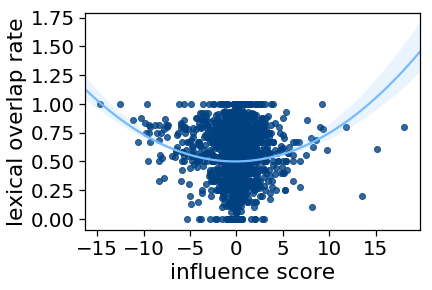

[0.00240382 0.00066361 0.49924437]
2
The banker recommended the judge by the presidents . The judge recommended the presidents .
prediction: entailment , answer: non-entailment


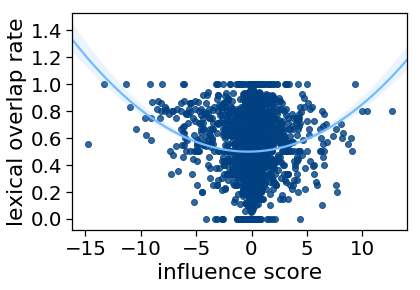

[0.00331658 0.00206802 0.49833161]
1
The managers saw the secretaries . The secretaries saw the managers .
prediction: entailment , answer: non-entailment


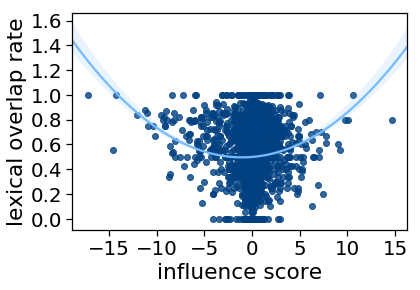

[0.00298435 0.00619774 0.49866383]
8
The actors who thanked the students admired the secretaries . The actors admired the secretaries .
prediction: entailment , answer: entailment


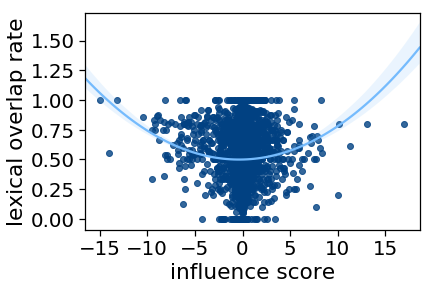

[0.00262227 0.00188078 0.49902591]
11
The senators heard the athlete stopped the artists . The senators heard the athlete .
prediction: entailment , answer: non-entailment


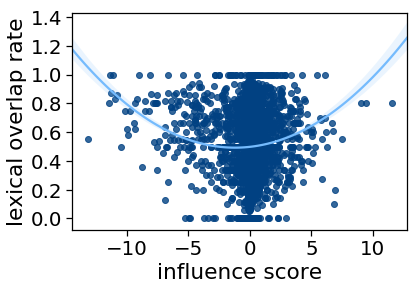

[0.00392051 0.00938568 0.49772768]
15
Before the managers presented the lawyers resigned . The managers presented the lawyers .
prediction: entailment , answer: non-entailment


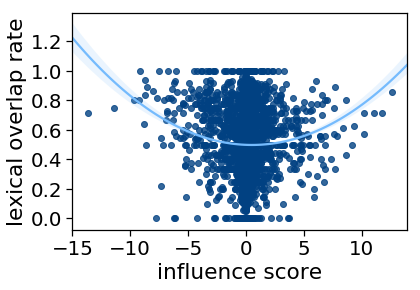

[ 0.00301799 -0.00311271  0.49863019]
19
The students saw the tourist that waited . The students saw the tourist .
prediction: entailment , answer: entailment


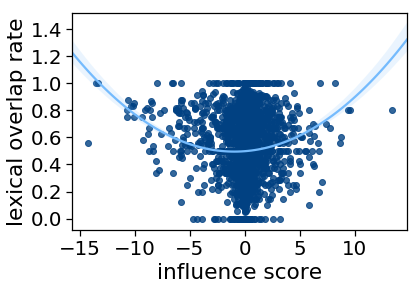

[0.00335541 0.00638858 0.49829278]
23
The president assumed that the senator resigned . The senator resigned .
prediction: entailment , answer: non-entailment


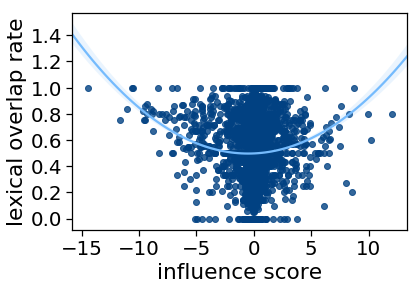

[0.0038725  0.00378848 0.49777569]
12
The doctor near the athlete avoided the lawyer . The athlete avoided the lawyer .
prediction: entailment , answer: non-entailment


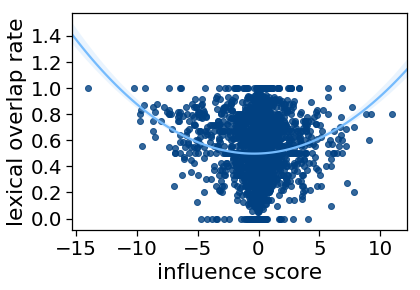

[0.00407812 0.00297071 0.49757006]
29
The bankers called the student , and the presidents recommended the secretaries . The presidents recommended the secretaries .
prediction: non-entailment , answer: entailment


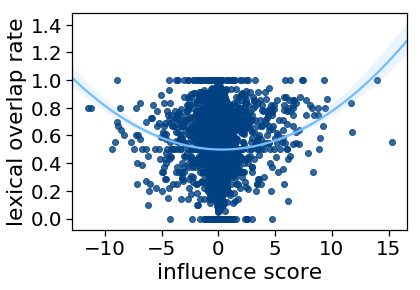

[ 0.00296896 -0.00201592  0.49867922]
21
Whether or not the secretary stopped the actors , the artist helped the bankers . The secretary stopped the actors .
prediction: non-entailment , answer: non-entailment


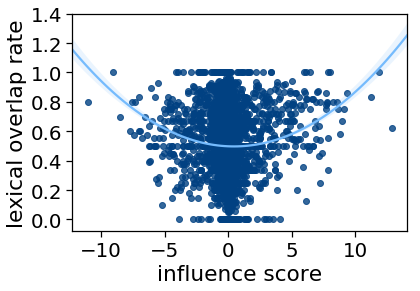

[ 0.00406886 -0.00378169  0.49757933]
27
Since the author introduced the actors , the senators called the tourists . The senators called the tourists .
prediction: non-entailment , answer: entailment


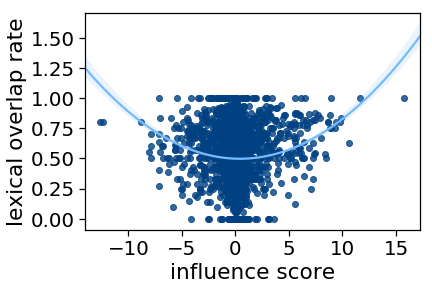

[ 0.00359459 -0.00305059  0.4980536 ]
13
The president who contacted the student shouted . The student shouted .
prediction: entailment , answer: non-entailment


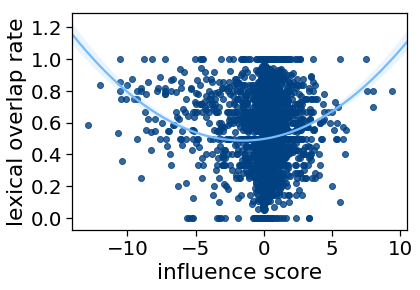

[0.00427292 0.01319995 0.49737526]
25
Maybe the artist slept . The artist slept .
prediction: entailment , answer: non-entailment


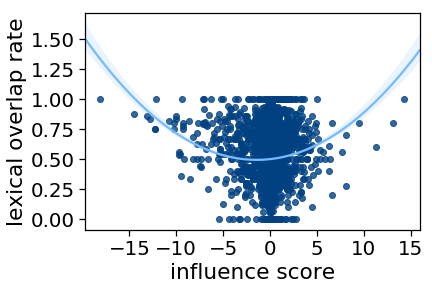

[0.00302289 0.00863633 0.49862529]
20
The lawyers saw the professor behind the bankers . The lawyers saw the professor .
prediction: entailment , answer: entailment


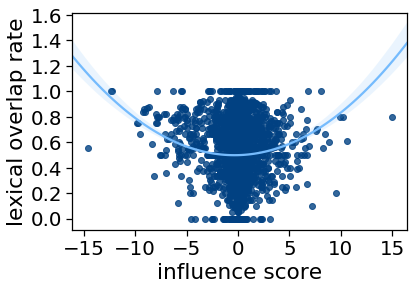

[0.00312638 0.00209063 0.4985218 ]
24
The author helped the secretary , or the actor recognized the judges . The actor recognized the judges .
prediction: entailment , answer: non-entailment


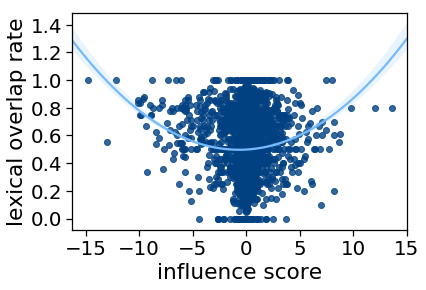

[0.00325285 0.00441549 0.49839534]


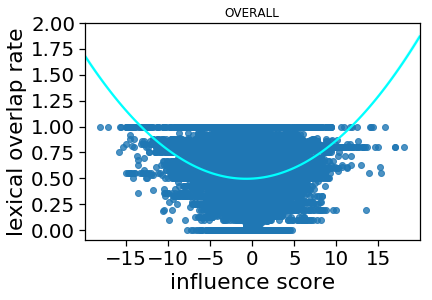

[0.00321298 0.00470081 0.49843521]


In [7]:
heuristic_effect_analysis(NLI_influence_dir, test_examples)

30
Definitely the artists mentioned the professor . The artists mentioned the professor .
prediction: entailment , answer: entailment


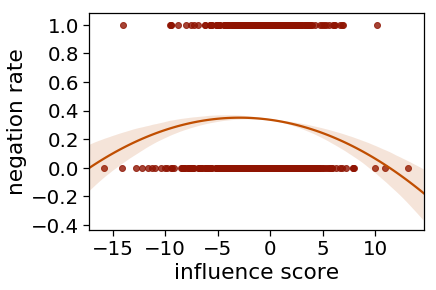

[-0.00171468 -0.00997699  0.33571468]
9
The actors recognized the lawyer and the professor . The actors recognized the professor .
prediction: non-entailment , answer: entailment


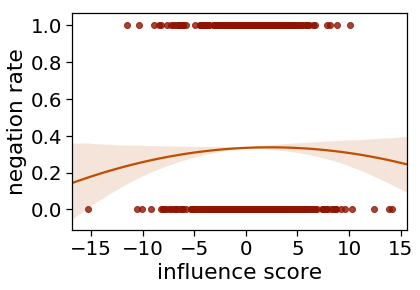

[-0.00052705  0.00247385  0.33452705]
28
The athlete remembered that the artist introduced the doctor . The artist introduced the doctor .
prediction: entailment , answer: entailment


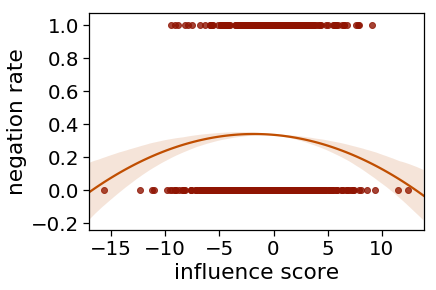

[-0.00152484 -0.00549057  0.33552484]
7
The athlete by the doctors encouraged the senator . The athlete encouraged the senator .
prediction: entailment , answer: entailment


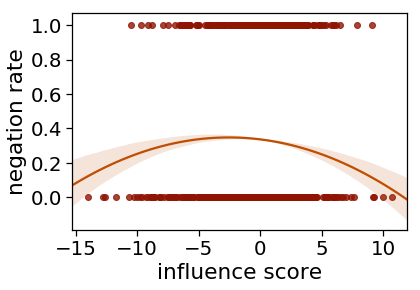

[-0.0017192  -0.00882174  0.3357192 ]
22
If the secretary helped the tourists , the student contacted the lawyers . The student contacted the lawyers .
prediction: entailment , answer: non-entailment


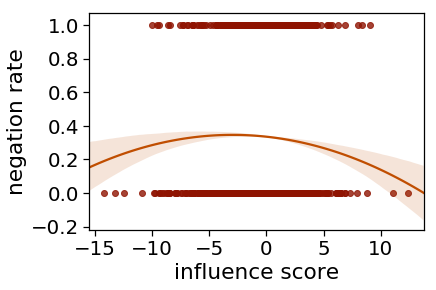

[-0.00123275 -0.00731916  0.33523275]
6
The tourist who the banker contacted called the lawyers . The banker contacted the tourist .
prediction: entailment , answer: entailment


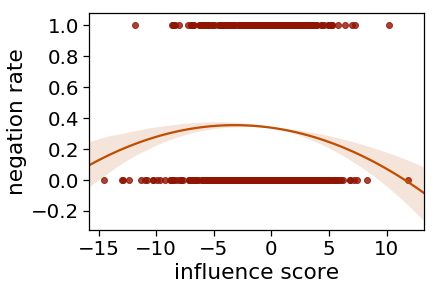

[-0.00162273 -0.01036516  0.33562273]
3
The actors who recommended the senators called the artists . The artists called the senators .
prediction: entailment , answer: non-entailment


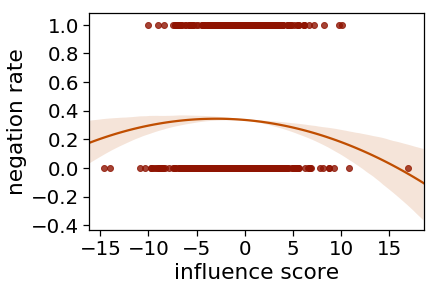

[-0.00096878 -0.0057414   0.33496878]
10
The manager was encouraged by the secretary . The secretary encouraged the manager .
prediction: entailment , answer: entailment


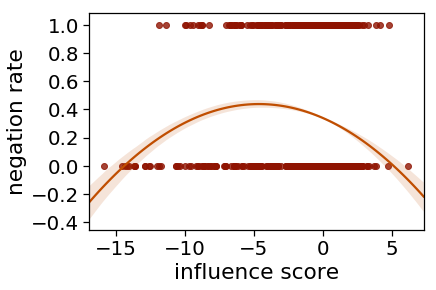

[-0.00460874 -0.04266455  0.33860874]
4
The banker was encouraged by the athletes . The banker encouraged the athletes .
prediction: entailment , answer: non-entailment


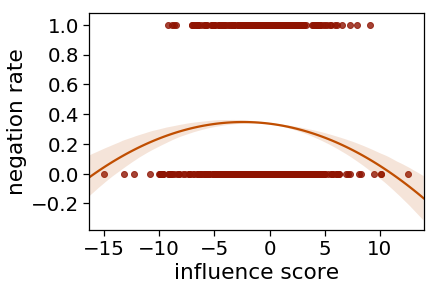

[-0.00191026 -0.00919214  0.33591026]
26
While the scientists saw the tourists , the artist resigned . The scientists saw the tourists .
prediction: entailment , answer: entailment


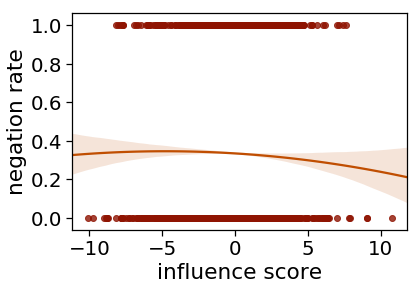

[-0.00048983 -0.00470643  0.33448983]
5
The scientist and the student called the athlete . The student called the scientist .
prediction: entailment , answer: non-entailment


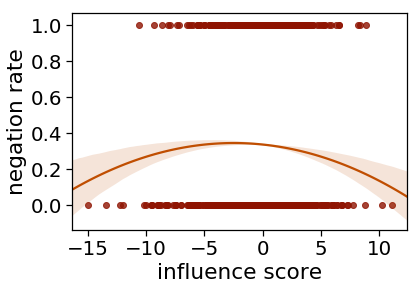

[-0.0013524  -0.00669009  0.3353524 ]
17
Important athletes arrived . Athletes arrived .
prediction: entailment , answer: entailment


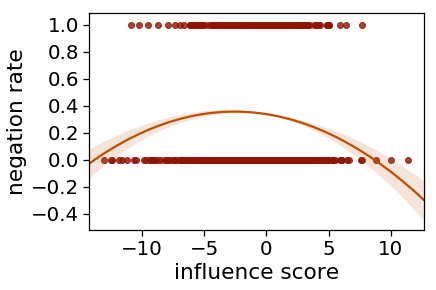

[-0.00281604 -0.01446021  0.33681604]
14
The scientist presented in the museum contacted the secretaries . The scientist presented in the museum .
prediction: entailment , answer: non-entailment


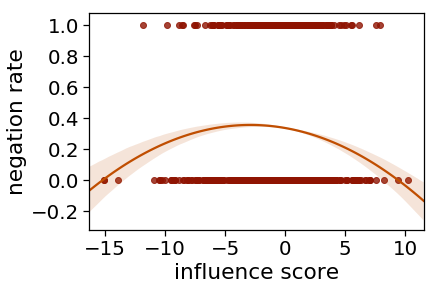

[-0.00234065 -0.01359836  0.33634065]
18
The lawyer won the tournament . The lawyer won .
prediction: entailment , answer: entailment


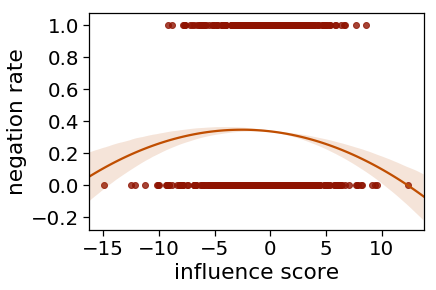

[-0.00156584 -0.00803059  0.33556584]
16
The students and the secretaries mentioned the doctor . The secretaries mentioned the doctor .
prediction: entailment , answer: entailment


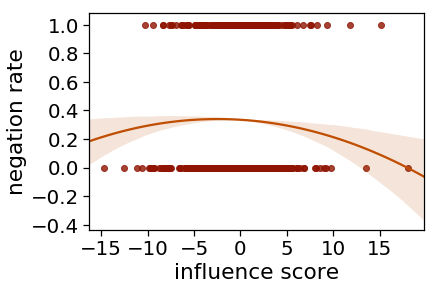

[-0.00081371 -0.00401059  0.33481371]
2
The banker recommended the judge by the presidents . The judge recommended the presidents .
prediction: entailment , answer: non-entailment


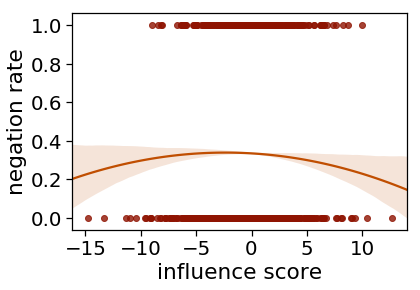

[-0.00071825 -0.00340865  0.33471825]
1
The managers saw the secretaries . The secretaries saw the managers .
prediction: entailment , answer: non-entailment


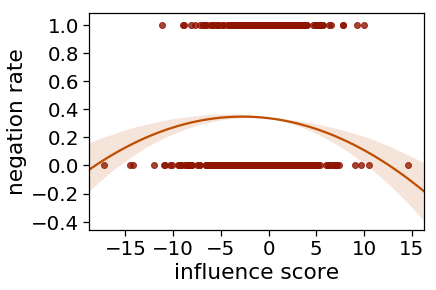

[-0.00146497 -0.00806872  0.33546497]
8
The actors who thanked the students admired the secretaries . The actors admired the secretaries .
prediction: entailment , answer: entailment


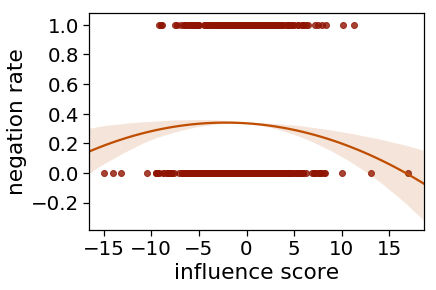

[-0.00095089 -0.0041797   0.33495089]
11
The senators heard the athlete stopped the artists . The senators heard the athlete .
prediction: entailment , answer: non-entailment


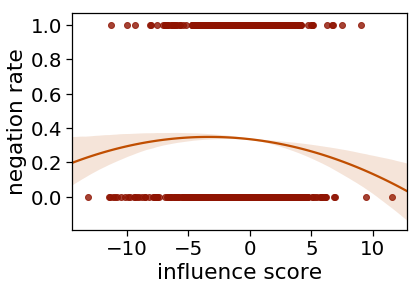

[-0.00122416 -0.00807372  0.33522416]
15
Before the managers presented the lawyers resigned . The managers presented the lawyers .
prediction: entailment , answer: non-entailment


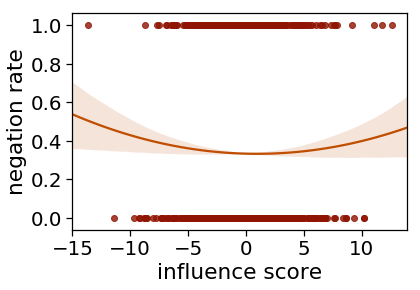

[ 0.00080765 -0.00153245  0.33319235]
19
The students saw the tourist that waited . The students saw the tourist .
prediction: entailment , answer: entailment


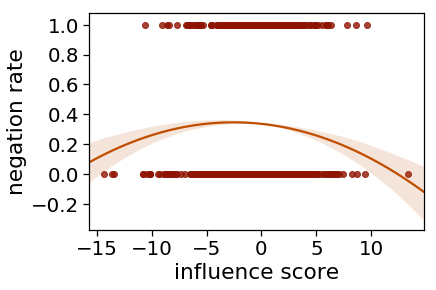

[-0.00155414 -0.00790568  0.33555414]
23
The president assumed that the senator resigned . The senator resigned .
prediction: entailment , answer: non-entailment


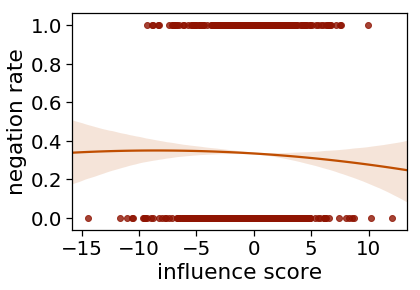

[-2.14098425e-04 -3.64445618e-03  3.34214098e-01]
12
The doctor near the athlete avoided the lawyer . The athlete avoided the lawyer .
prediction: entailment , answer: non-entailment


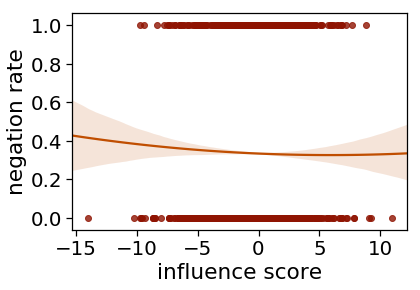

[ 2.25729901e-04 -2.67059736e-03  3.33774270e-01]
29
The bankers called the student , and the presidents recommended the secretaries . The presidents recommended the secretaries .
prediction: non-entailment , answer: entailment


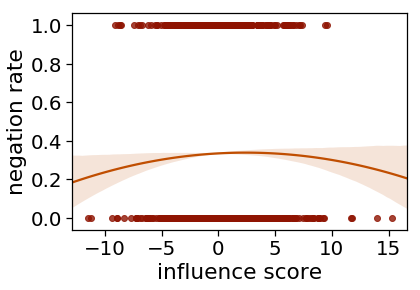

[-0.00066374  0.0032096   0.33466374]
21
Whether or not the secretary stopped the actors , the artist helped the bankers . The secretary stopped the actors .
prediction: non-entailment , answer: non-entailment


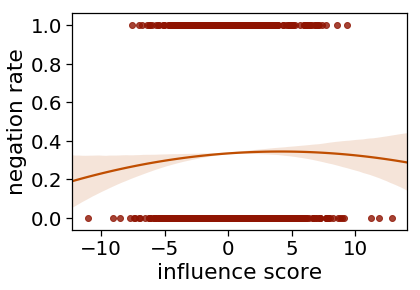

[-0.00057303  0.00473354  0.33457303]
27
Since the author introduced the actors , the senators called the tourists . The senators called the tourists .
prediction: non-entailment , answer: entailment


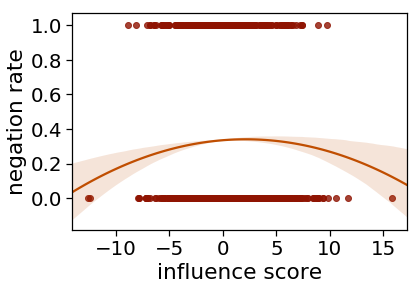

[-0.00116364  0.00499268  0.33516364]
13
The president who contacted the student shouted . The student shouted .
prediction: entailment , answer: non-entailment


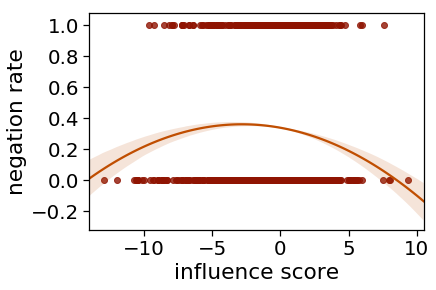

[-0.0027978  -0.01579236  0.3367978 ]
25
Maybe the artist slept . The artist slept .
prediction: entailment , answer: non-entailment


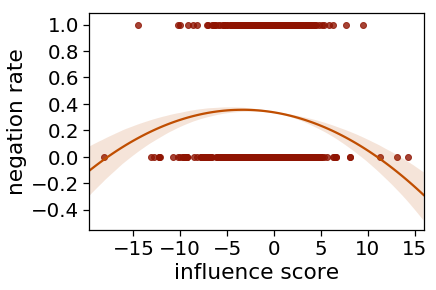

[-0.0017252  -0.01161055  0.3357252 ]
20
The lawyers saw the professor behind the bankers . The lawyers saw the professor .
prediction: entailment , answer: entailment


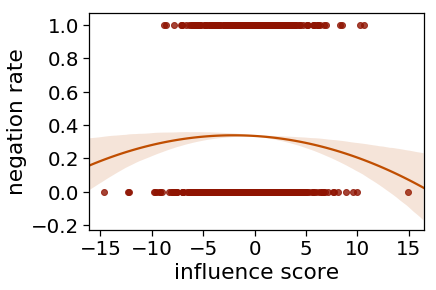

[-0.000921  -0.0037714  0.334921 ]
24
The author helped the secretary , or the actor recognized the judges . The actor recognized the judges .
prediction: entailment , answer: non-entailment


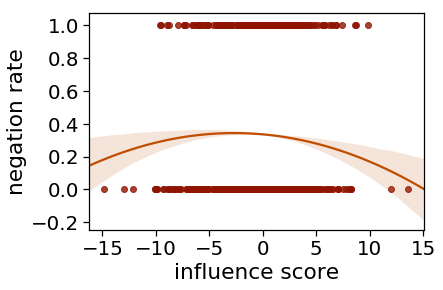

[-0.00108086 -0.00579431  0.33508086]


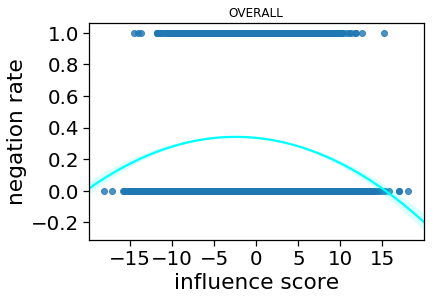

[-0.00107222 -0.00527935  0.33507222]


In [8]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, h='negation')

30
Definitely the artists mentioned the professor . The artists mentioned the professor .
prediction: entailment , answer: entailment


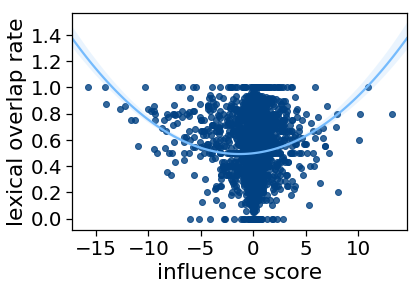

[0.00347125 0.00918112 0.49817694]
9
28
The athlete remembered that the artist introduced the doctor . The artist introduced the doctor .
prediction: entailment , answer: entailment


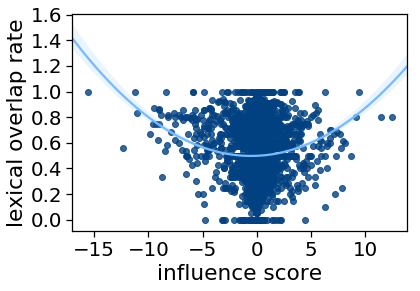

[0.0033784  0.00361492 0.49826979]
7
The athlete by the doctors encouraged the senator . The athlete encouraged the senator .
prediction: entailment , answer: entailment


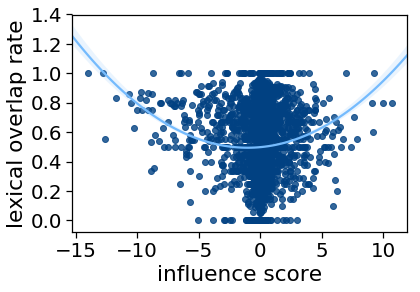

[0.00373619 0.00774825 0.497912  ]
22
If the secretary helped the tourists , the student contacted the lawyers . The student contacted the lawyers .
prediction: entailment , answer: non-entailment


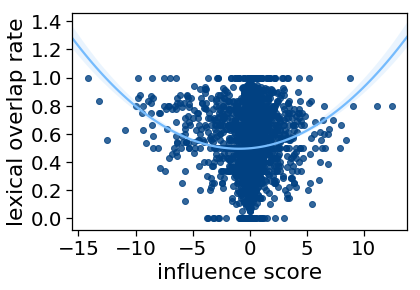

[0.00367604 0.00680741 0.49797215]
6
The tourist who the banker contacted called the lawyers . The banker contacted the tourist .
prediction: entailment , answer: entailment


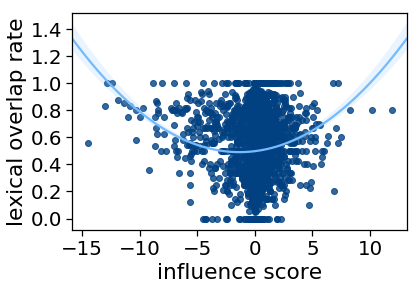

[0.00397507 0.01059446 0.49767311]
3
The actors who recommended the senators called the artists . The artists called the senators .
prediction: entailment , answer: non-entailment


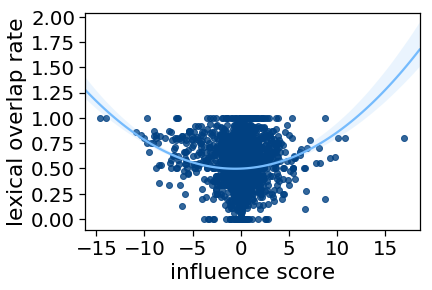

[0.00321025 0.00369257 0.49843794]
10
The manager was encouraged by the secretary . The secretary encouraged the manager .
prediction: entailment , answer: entailment


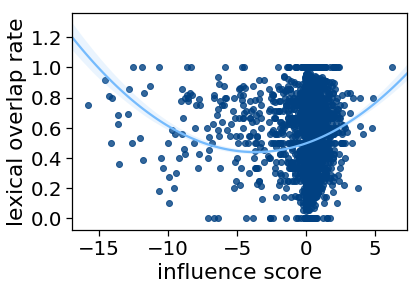

[0.0043231  0.03180723 0.49732509]
4
The banker was encouraged by the athletes . The banker encouraged the athletes .
prediction: entailment , answer: non-entailment


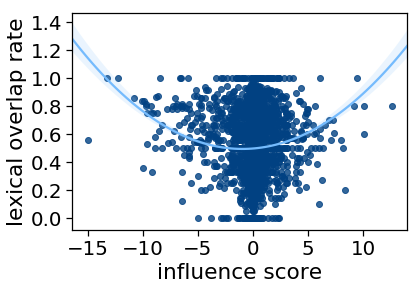

[0.00329202 0.00628362 0.49835617]
26
While the scientists saw the tourists , the artist resigned . The scientists saw the tourists .
prediction: entailment , answer: entailment


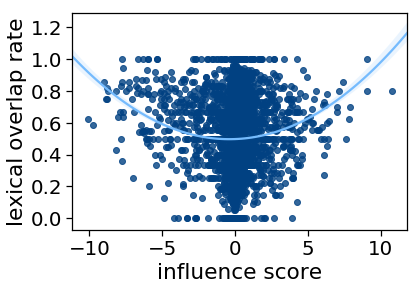

[0.00448712 0.00359766 0.49716107]
5
The scientist and the student called the athlete . The student called the scientist .
prediction: entailment , answer: non-entailment


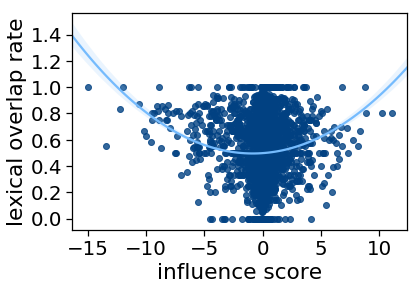

[0.00373417 0.00627652 0.49791402]
17
Important athletes arrived . Athletes arrived .
prediction: entailment , answer: entailment


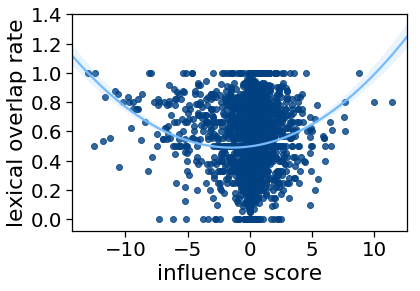

[0.00380808 0.01101827 0.49784011]
14
The scientist presented in the museum contacted the secretaries . The scientist presented in the museum .
prediction: entailment , answer: non-entailment


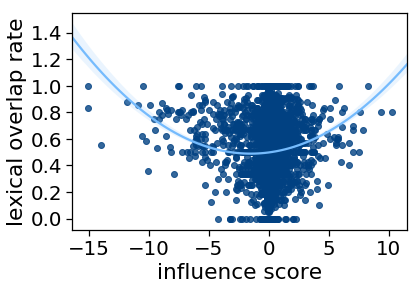

[0.00395856 0.0118481  0.49768962]
18
The lawyer won the tournament . The lawyer won .
prediction: entailment , answer: entailment


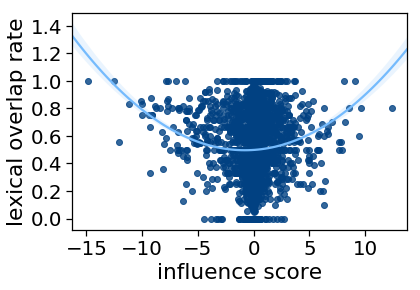

[0.00346747 0.00548899 0.49818072]
16
The students and the secretaries mentioned the doctor . The secretaries mentioned the doctor .
prediction: entailment , answer: entailment


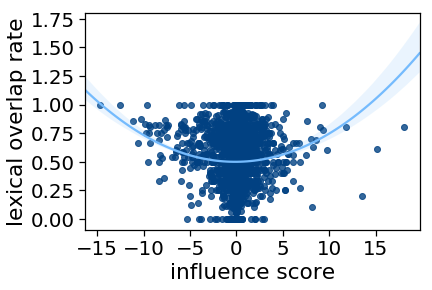

[0.00240382 0.00066361 0.49924437]
2
The banker recommended the judge by the presidents . The judge recommended the presidents .
prediction: entailment , answer: non-entailment


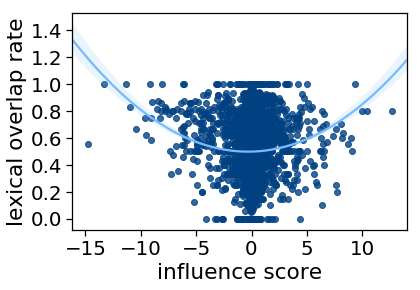

[0.00331658 0.00206802 0.49833161]
1
The managers saw the secretaries . The secretaries saw the managers .
prediction: entailment , answer: non-entailment


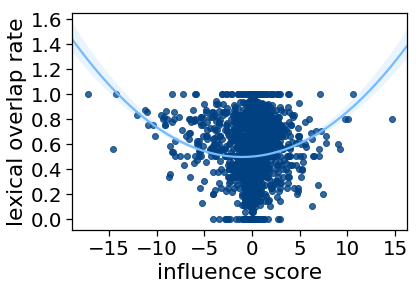

[0.00298435 0.00619774 0.49866383]
8
The actors who thanked the students admired the secretaries . The actors admired the secretaries .
prediction: entailment , answer: entailment


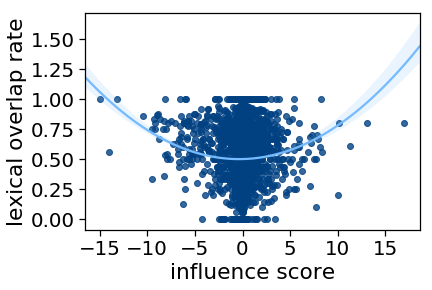

[0.00262227 0.00188078 0.49902591]
11
The senators heard the athlete stopped the artists . The senators heard the athlete .
prediction: entailment , answer: non-entailment


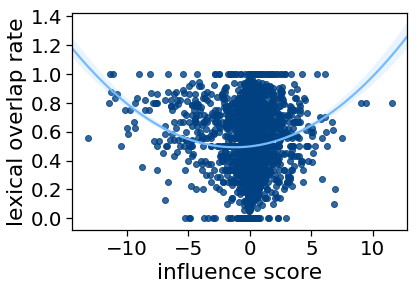

[0.00392051 0.00938568 0.49772768]
15
Before the managers presented the lawyers resigned . The managers presented the lawyers .
prediction: entailment , answer: non-entailment


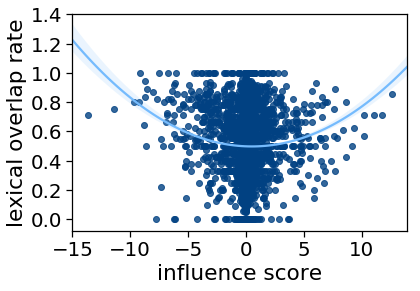

[ 0.00301799 -0.00311271  0.49863019]
19
The students saw the tourist that waited . The students saw the tourist .
prediction: entailment , answer: entailment


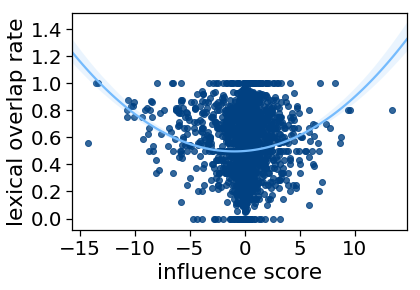

[0.00335541 0.00638858 0.49829278]
23
The president assumed that the senator resigned . The senator resigned .
prediction: entailment , answer: non-entailment


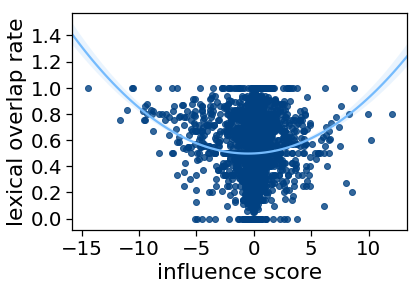

[0.0038725  0.00378848 0.49777569]
12
The doctor near the athlete avoided the lawyer . The athlete avoided the lawyer .
prediction: entailment , answer: non-entailment


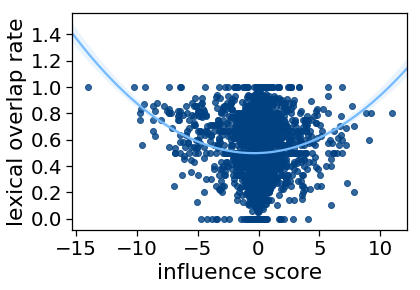

[0.00407812 0.00297071 0.49757006]
29
21
27
13
The president who contacted the student shouted . The student shouted .
prediction: entailment , answer: non-entailment


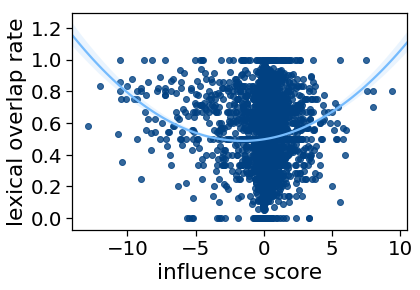

[0.00427292 0.01319995 0.49737526]
25
Maybe the artist slept . The artist slept .
prediction: entailment , answer: non-entailment


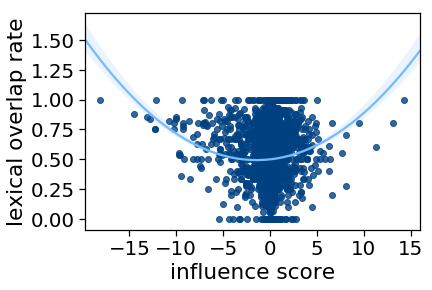

[0.00302289 0.00863633 0.49862529]
20
The lawyers saw the professor behind the bankers . The lawyers saw the professor .
prediction: entailment , answer: entailment


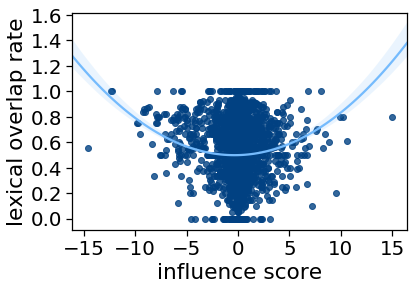

[0.00312638 0.00209063 0.4985218 ]
24
The author helped the secretary , or the actor recognized the judges . The actor recognized the judges .
prediction: entailment , answer: non-entailment


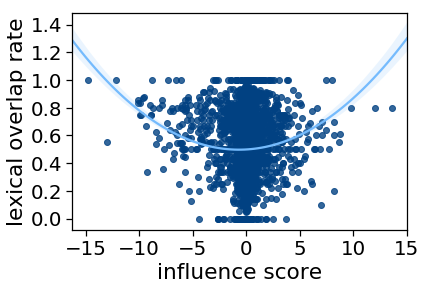

[0.00325285 0.00441549 0.49839534]


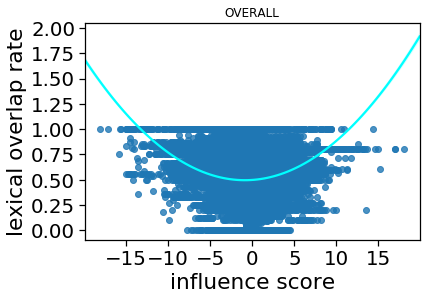

[0.00328232 0.00584762 0.49836587]


In [9]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, label_restriction="pred_label_entailment")

30
Definitely the artists mentioned the professor . The artists mentioned the professor .
prediction: entailment , answer: entailment


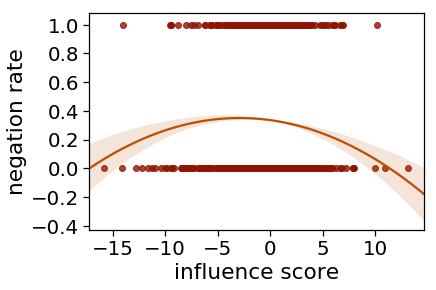

[-0.00171468 -0.00997699  0.33571468]
9
28
The athlete remembered that the artist introduced the doctor . The artist introduced the doctor .
prediction: entailment , answer: entailment


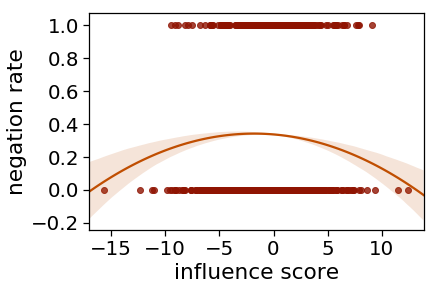

[-0.00152484 -0.00549057  0.33552484]
7
The athlete by the doctors encouraged the senator . The athlete encouraged the senator .
prediction: entailment , answer: entailment


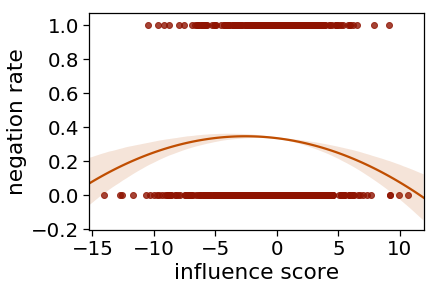

[-0.0017192  -0.00882174  0.3357192 ]
22
If the secretary helped the tourists , the student contacted the lawyers . The student contacted the lawyers .
prediction: entailment , answer: non-entailment


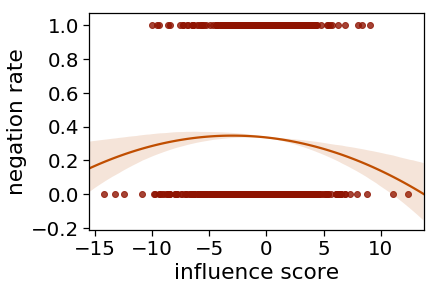

[-0.00123275 -0.00731916  0.33523275]
6
The tourist who the banker contacted called the lawyers . The banker contacted the tourist .
prediction: entailment , answer: entailment


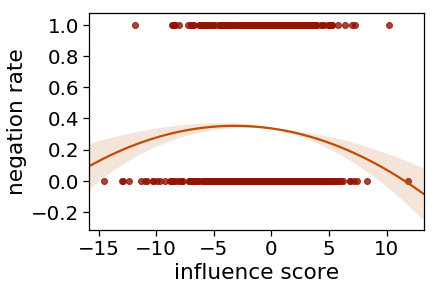

[-0.00162273 -0.01036516  0.33562273]
3
The actors who recommended the senators called the artists . The artists called the senators .
prediction: entailment , answer: non-entailment


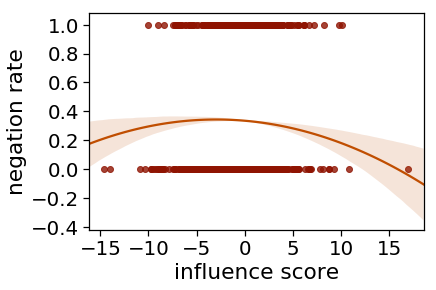

[-0.00096878 -0.0057414   0.33496878]
10
The manager was encouraged by the secretary . The secretary encouraged the manager .
prediction: entailment , answer: entailment


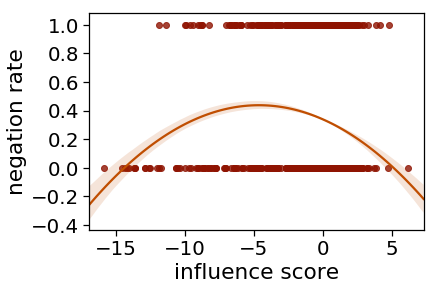

[-0.00460874 -0.04266455  0.33860874]
4
The banker was encouraged by the athletes . The banker encouraged the athletes .
prediction: entailment , answer: non-entailment


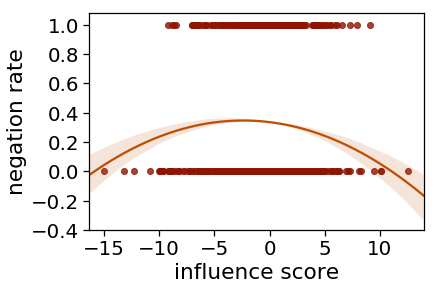

[-0.00191026 -0.00919214  0.33591026]
26
While the scientists saw the tourists , the artist resigned . The scientists saw the tourists .
prediction: entailment , answer: entailment


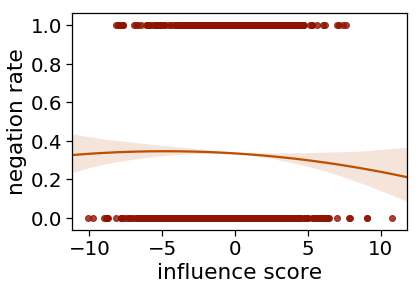

[-0.00048983 -0.00470643  0.33448983]
5
The scientist and the student called the athlete . The student called the scientist .
prediction: entailment , answer: non-entailment


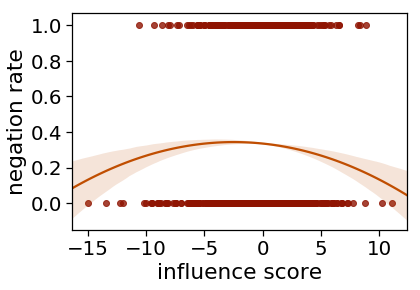

[-0.0013524  -0.00669009  0.3353524 ]
17
Important athletes arrived . Athletes arrived .
prediction: entailment , answer: entailment


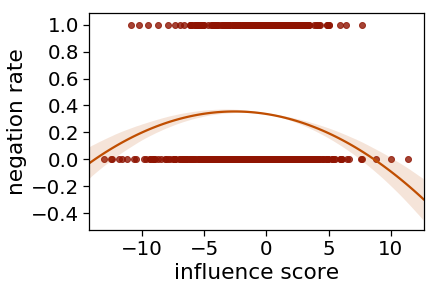

[-0.00281604 -0.01446021  0.33681604]
14
The scientist presented in the museum contacted the secretaries . The scientist presented in the museum .
prediction: entailment , answer: non-entailment


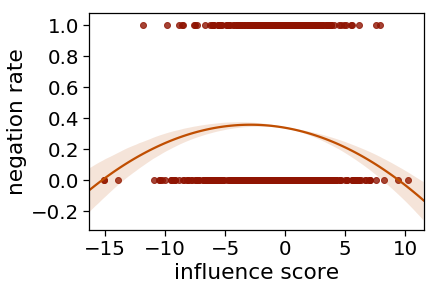

[-0.00234065 -0.01359836  0.33634065]
18
The lawyer won the tournament . The lawyer won .
prediction: entailment , answer: entailment


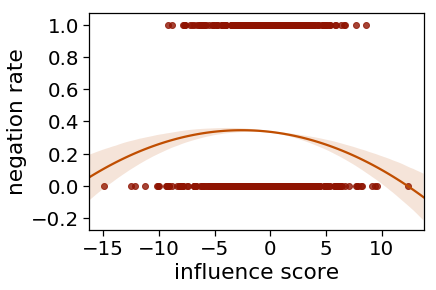

[-0.00156584 -0.00803059  0.33556584]
16
The students and the secretaries mentioned the doctor . The secretaries mentioned the doctor .
prediction: entailment , answer: entailment


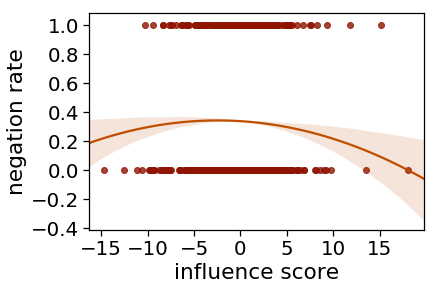

[-0.00081371 -0.00401059  0.33481371]
2
The banker recommended the judge by the presidents . The judge recommended the presidents .
prediction: entailment , answer: non-entailment


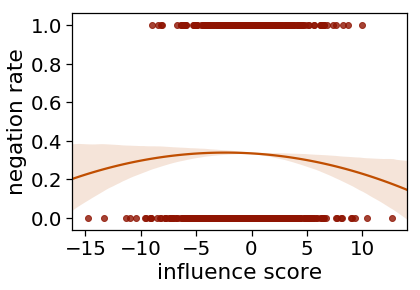

[-0.00071825 -0.00340865  0.33471825]
1
The managers saw the secretaries . The secretaries saw the managers .
prediction: entailment , answer: non-entailment


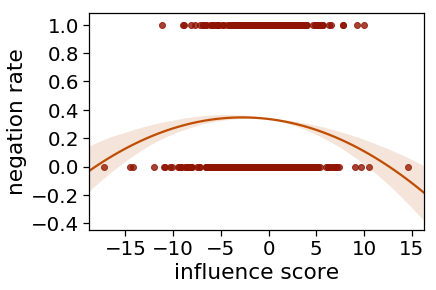

[-0.00146497 -0.00806872  0.33546497]
8
The actors who thanked the students admired the secretaries . The actors admired the secretaries .
prediction: entailment , answer: entailment


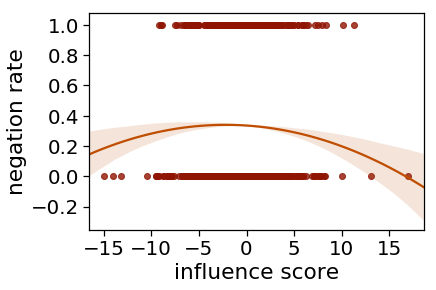

[-0.00095089 -0.0041797   0.33495089]
11
The senators heard the athlete stopped the artists . The senators heard the athlete .
prediction: entailment , answer: non-entailment


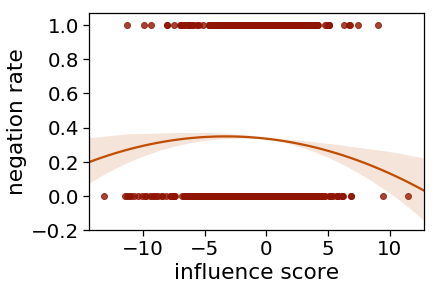

[-0.00122416 -0.00807372  0.33522416]
15
Before the managers presented the lawyers resigned . The managers presented the lawyers .
prediction: entailment , answer: non-entailment


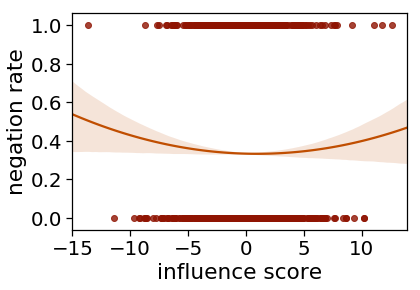

[ 0.00080765 -0.00153245  0.33319235]
19
The students saw the tourist that waited . The students saw the tourist .
prediction: entailment , answer: entailment


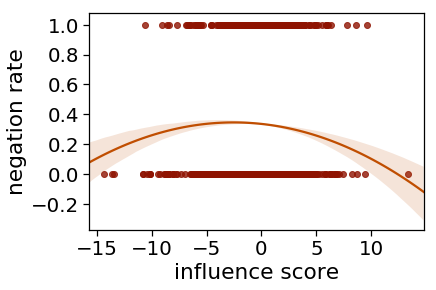

[-0.00155414 -0.00790568  0.33555414]
23
The president assumed that the senator resigned . The senator resigned .
prediction: entailment , answer: non-entailment


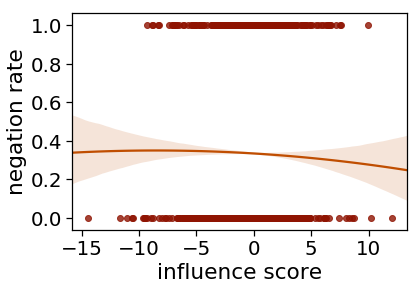

[-2.14098425e-04 -3.64445618e-03  3.34214098e-01]
12
The doctor near the athlete avoided the lawyer . The athlete avoided the lawyer .
prediction: entailment , answer: non-entailment


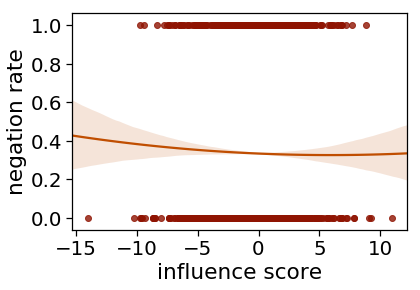

[ 2.25729901e-04 -2.67059736e-03  3.33774270e-01]
29
21
27
13
The president who contacted the student shouted . The student shouted .
prediction: entailment , answer: non-entailment


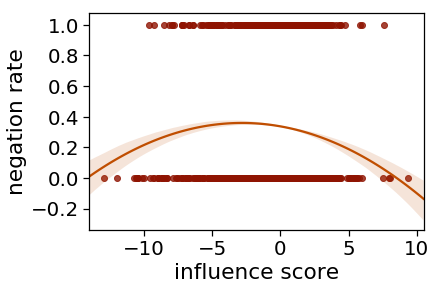

[-0.0027978  -0.01579236  0.3367978 ]
25
Maybe the artist slept . The artist slept .
prediction: entailment , answer: non-entailment


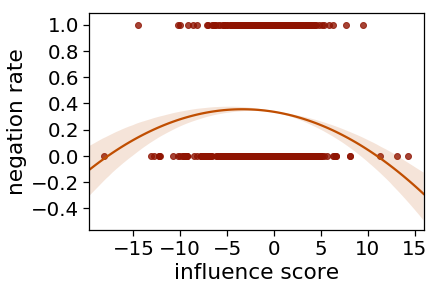

[-0.0017252  -0.01161055  0.3357252 ]
20
The lawyers saw the professor behind the bankers . The lawyers saw the professor .
prediction: entailment , answer: entailment


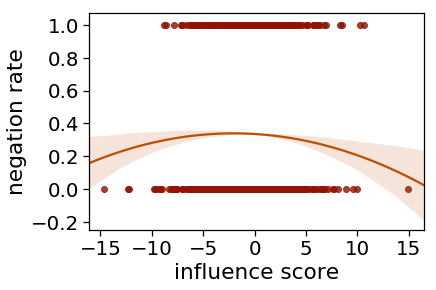

[-0.000921  -0.0037714  0.334921 ]
24
The author helped the secretary , or the actor recognized the judges . The actor recognized the judges .
prediction: entailment , answer: non-entailment


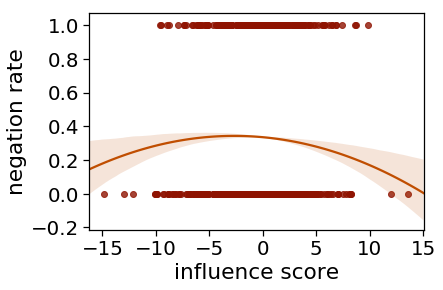

[-0.00108086 -0.00579431  0.33508086]


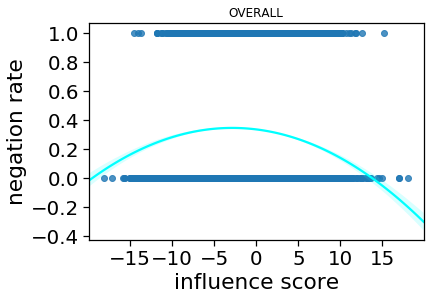

[-0.00124485 -0.00714903  0.33524485]


In [10]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, h='negation', label_restriction="pred_label_entailment")

30
9
The actors recognized the lawyer and the professor . The actors recognized the professor .
prediction: non-entailment , answer: entailment


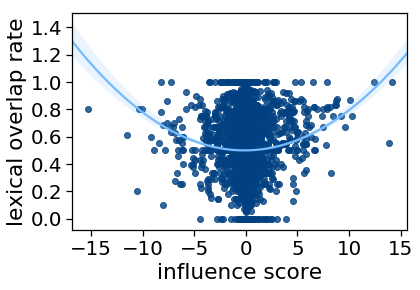

[0.002868   0.00076924 0.49878018]
28
7
22
6
3
10
4
26
5
17
14
18
16
2
1
8
11
15
19
23
12
29
The bankers called the student , and the presidents recommended the secretaries . The presidents recommended the secretaries .
prediction: non-entailment , answer: entailment


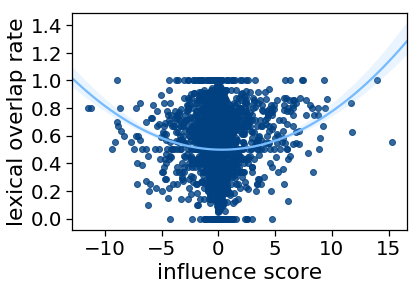

[ 0.00296896 -0.00201592  0.49867922]
21
Whether or not the secretary stopped the actors , the artist helped the bankers . The secretary stopped the actors .
prediction: non-entailment , answer: non-entailment


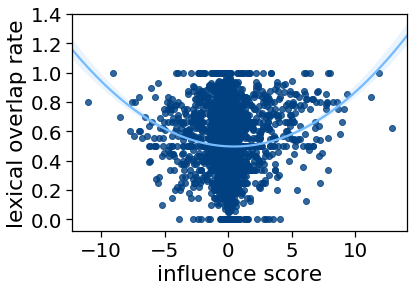

[ 0.00406886 -0.00378169  0.49757933]
27
Since the author introduced the actors , the senators called the tourists . The senators called the tourists .
prediction: non-entailment , answer: entailment


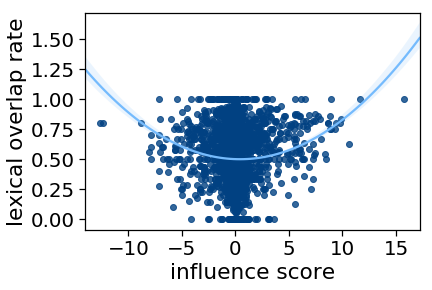

[ 0.00359459 -0.00305059  0.4980536 ]
13
25
20
24


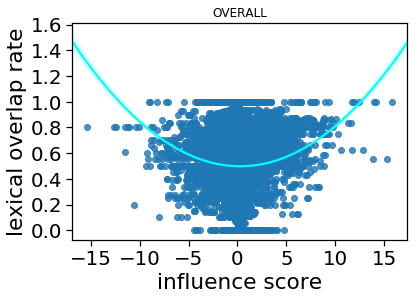

[ 0.00329529 -0.0017863   0.4983529 ]


In [11]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, label_restriction="pred_label_non-entailment")

30
9
The actors recognized the lawyer and the professor . The actors recognized the professor .
prediction: non-entailment , answer: entailment


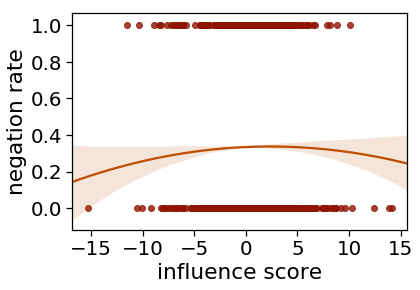

[-0.00052705  0.00247385  0.33452705]
28
7
22
6
3
10
4
26
5
17
14
18
16
2
1
8
11
15
19
23
12
29
The bankers called the student , and the presidents recommended the secretaries . The presidents recommended the secretaries .
prediction: non-entailment , answer: entailment


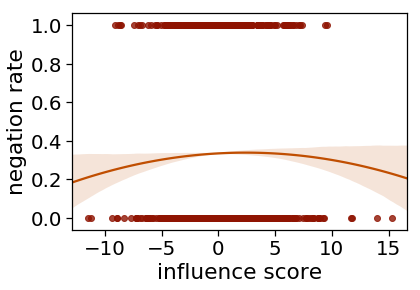

[-0.00066374  0.0032096   0.33466374]
21
Whether or not the secretary stopped the actors , the artist helped the bankers . The secretary stopped the actors .
prediction: non-entailment , answer: non-entailment


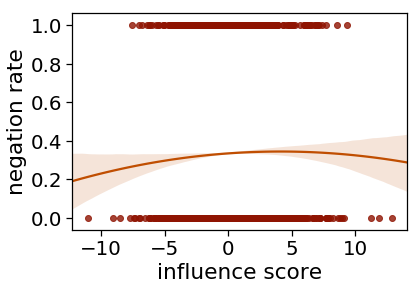

[-0.00057303  0.00473354  0.33457303]
27
Since the author introduced the actors , the senators called the tourists . The senators called the tourists .
prediction: non-entailment , answer: entailment


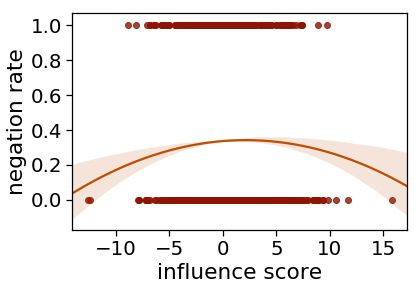

[-0.00116364  0.00499268  0.33516364]
13
25
20
24


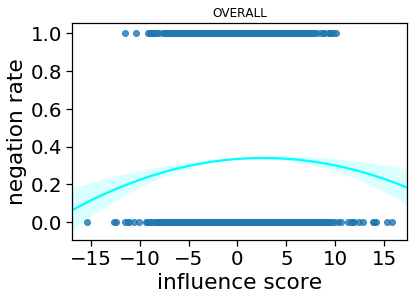

[-0.00072198  0.00379373  0.33472198]


In [12]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, h='negation', label_restriction="pred_label_non-entailment")

30
Definitely the artists mentioned the professor . The artists mentioned the professor .
prediction: entailment , answer: entailment


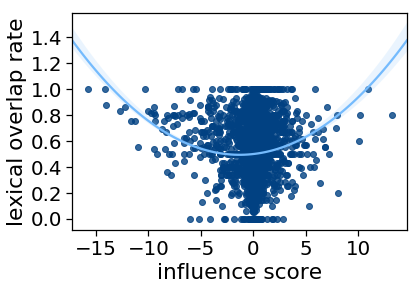

[0.00347125 0.00918112 0.49817694]
9
The actors recognized the lawyer and the professor . The actors recognized the professor .
prediction: non-entailment , answer: entailment


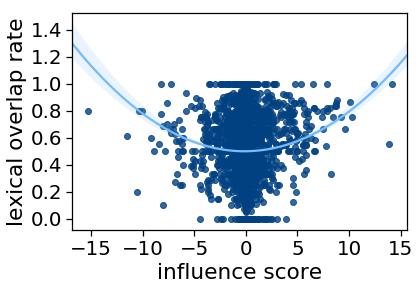

[0.002868   0.00076924 0.49878018]
28
The athlete remembered that the artist introduced the doctor . The artist introduced the doctor .
prediction: entailment , answer: entailment


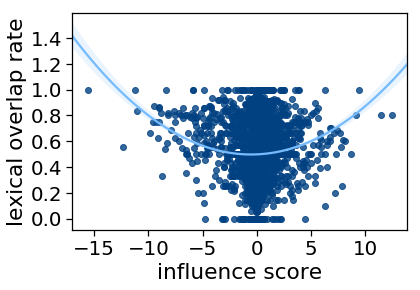

[0.0033784  0.00361492 0.49826979]
7
The athlete by the doctors encouraged the senator . The athlete encouraged the senator .
prediction: entailment , answer: entailment


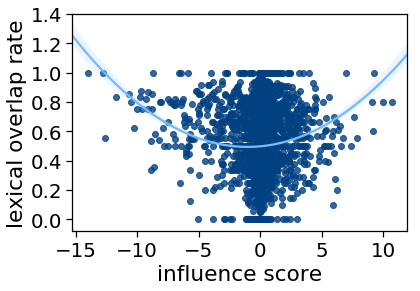

[0.00373619 0.00774825 0.497912  ]
22
6
The tourist who the banker contacted called the lawyers . The banker contacted the tourist .
prediction: entailment , answer: entailment


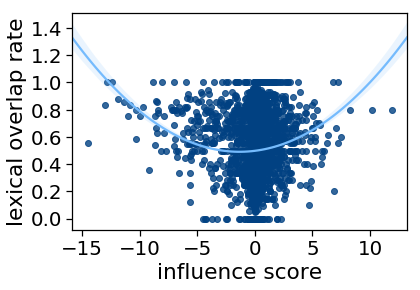

[0.00397507 0.01059446 0.49767311]
3
10
The manager was encouraged by the secretary . The secretary encouraged the manager .
prediction: entailment , answer: entailment


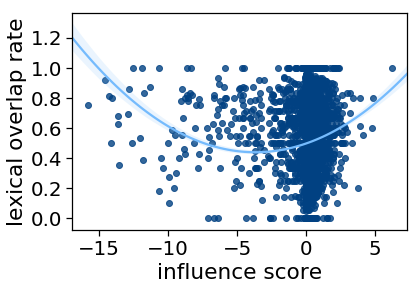

[0.0043231  0.03180723 0.49732509]
4
26
While the scientists saw the tourists , the artist resigned . The scientists saw the tourists .
prediction: entailment , answer: entailment


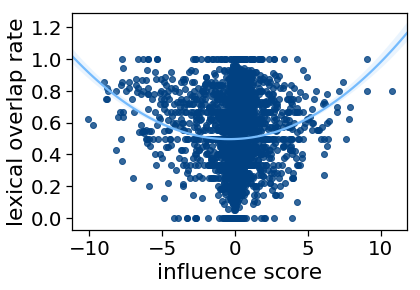

[0.00448712 0.00359766 0.49716107]
5
17
Important athletes arrived . Athletes arrived .
prediction: entailment , answer: entailment


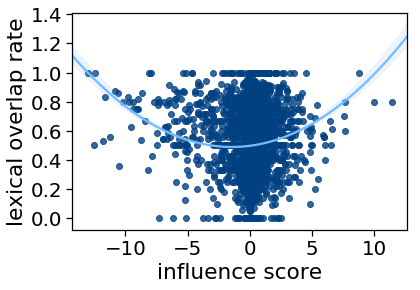

[0.00380808 0.01101827 0.49784011]
14
18
The lawyer won the tournament . The lawyer won .
prediction: entailment , answer: entailment


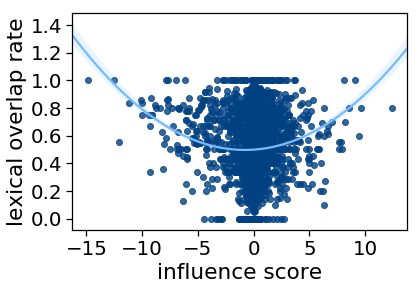

[0.00346747 0.00548899 0.49818072]
16
The students and the secretaries mentioned the doctor . The secretaries mentioned the doctor .
prediction: entailment , answer: entailment


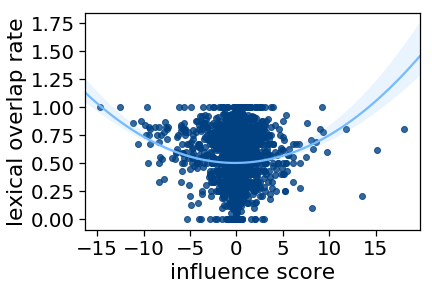

[0.00240382 0.00066361 0.49924437]
2
1
8
The actors who thanked the students admired the secretaries . The actors admired the secretaries .
prediction: entailment , answer: entailment


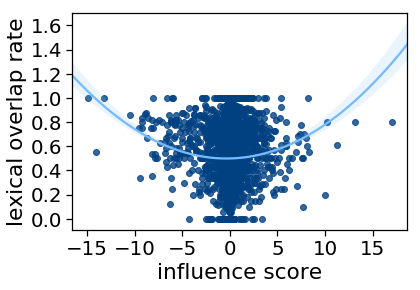

[0.00262227 0.00188078 0.49902591]
11
15
19
The students saw the tourist that waited . The students saw the tourist .
prediction: entailment , answer: entailment


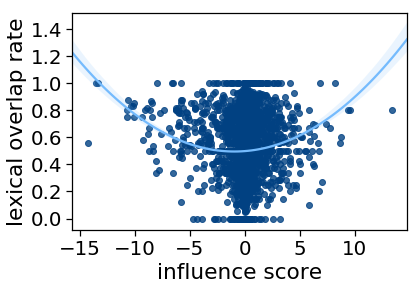

[0.00335541 0.00638858 0.49829278]
23
12
29
The bankers called the student , and the presidents recommended the secretaries . The presidents recommended the secretaries .
prediction: non-entailment , answer: entailment


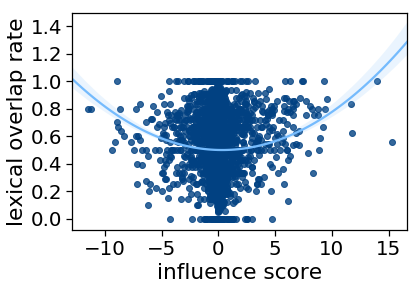

[ 0.00296896 -0.00201592  0.49867922]
21
27
Since the author introduced the actors , the senators called the tourists . The senators called the tourists .
prediction: non-entailment , answer: entailment


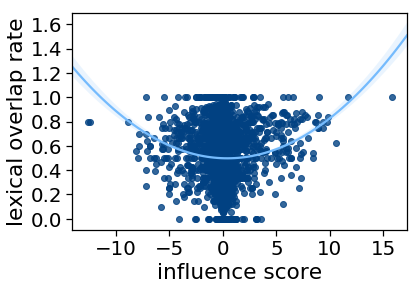

[ 0.00359459 -0.00305059  0.4980536 ]
13
25
20
The lawyers saw the professor behind the bankers . The lawyers saw the professor .
prediction: entailment , answer: entailment


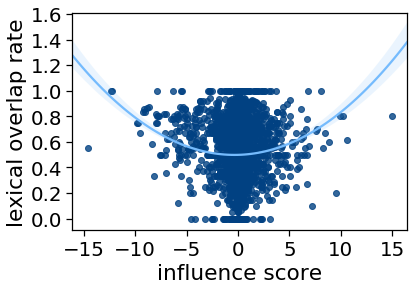

[0.00312638 0.00209063 0.4985218 ]
24


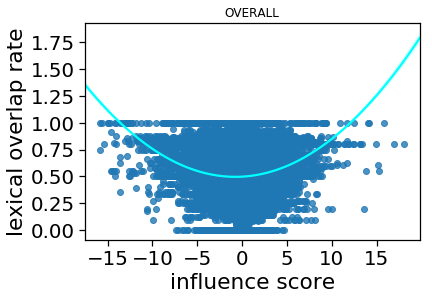

[0.00304824 0.00459297 0.49859994]


In [13]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, label_restriction="correct_label_entailment")

30
Definitely the artists mentioned the professor . The artists mentioned the professor .
prediction: entailment , answer: entailment


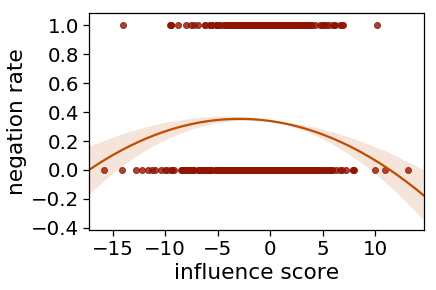

[-0.00171468 -0.00997699  0.33571468]
9
The actors recognized the lawyer and the professor . The actors recognized the professor .
prediction: non-entailment , answer: entailment


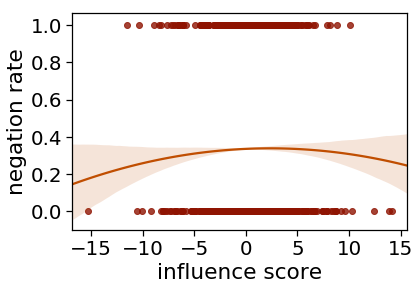

[-0.00052705  0.00247385  0.33452705]
28
The athlete remembered that the artist introduced the doctor . The artist introduced the doctor .
prediction: entailment , answer: entailment


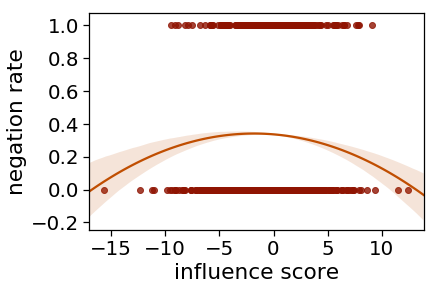

[-0.00152484 -0.00549057  0.33552484]
7
The athlete by the doctors encouraged the senator . The athlete encouraged the senator .
prediction: entailment , answer: entailment


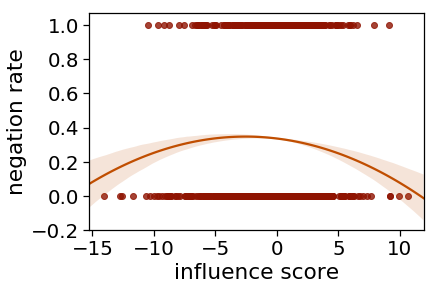

[-0.0017192  -0.00882174  0.3357192 ]
22
6
The tourist who the banker contacted called the lawyers . The banker contacted the tourist .
prediction: entailment , answer: entailment


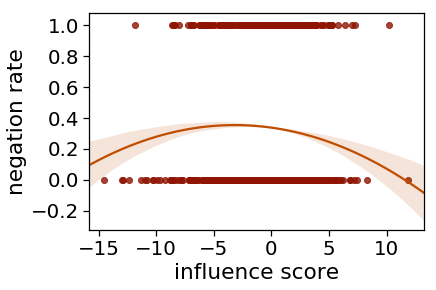

[-0.00162273 -0.01036516  0.33562273]
3
10
The manager was encouraged by the secretary . The secretary encouraged the manager .
prediction: entailment , answer: entailment


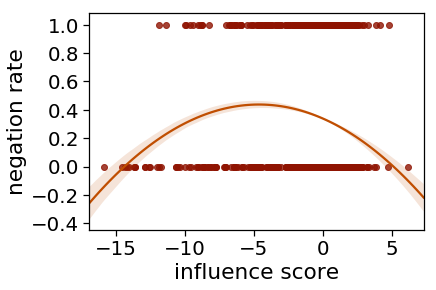

[-0.00460874 -0.04266455  0.33860874]
4
26
While the scientists saw the tourists , the artist resigned . The scientists saw the tourists .
prediction: entailment , answer: entailment


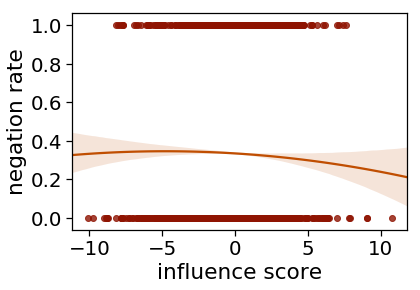

[-0.00048983 -0.00470643  0.33448983]
5
17
Important athletes arrived . Athletes arrived .
prediction: entailment , answer: entailment


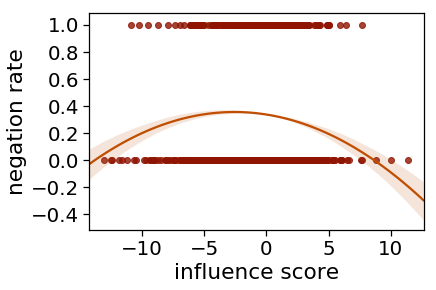

[-0.00281604 -0.01446021  0.33681604]
14
18
The lawyer won the tournament . The lawyer won .
prediction: entailment , answer: entailment


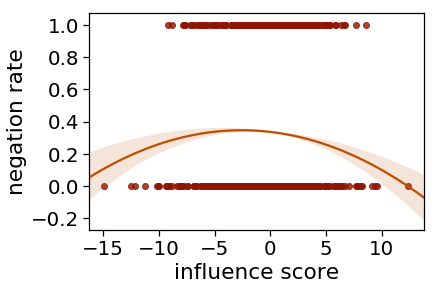

[-0.00156584 -0.00803059  0.33556584]
16
The students and the secretaries mentioned the doctor . The secretaries mentioned the doctor .
prediction: entailment , answer: entailment


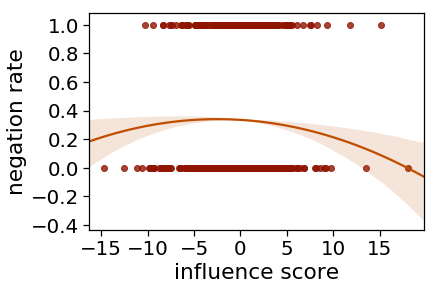

[-0.00081371 -0.00401059  0.33481371]
2
1
8
The actors who thanked the students admired the secretaries . The actors admired the secretaries .
prediction: entailment , answer: entailment


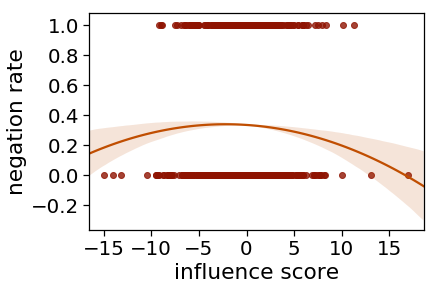

[-0.00095089 -0.0041797   0.33495089]
11
15
19
The students saw the tourist that waited . The students saw the tourist .
prediction: entailment , answer: entailment


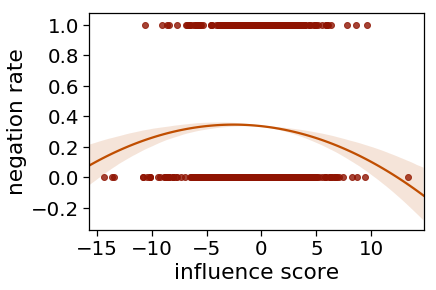

[-0.00155414 -0.00790568  0.33555414]
23
12
29
The bankers called the student , and the presidents recommended the secretaries . The presidents recommended the secretaries .
prediction: non-entailment , answer: entailment


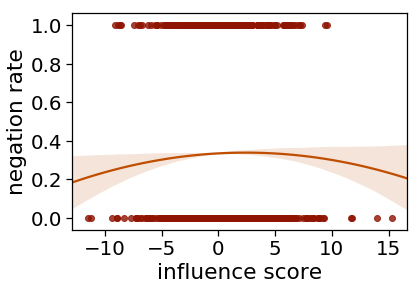

[-0.00066374  0.0032096   0.33466374]
21
27
Since the author introduced the actors , the senators called the tourists . The senators called the tourists .
prediction: non-entailment , answer: entailment


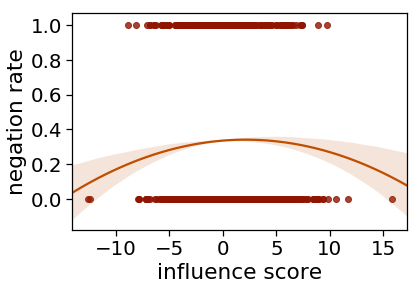

[-0.00116364  0.00499268  0.33516364]
13
25
20
The lawyers saw the professor behind the bankers . The lawyers saw the professor .
prediction: entailment , answer: entailment


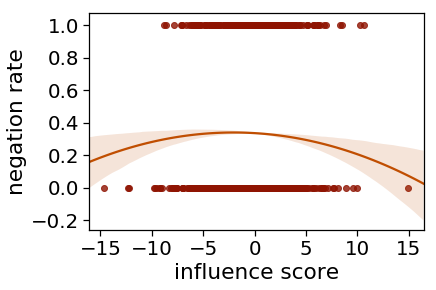

[-0.000921  -0.0037714  0.334921 ]
24


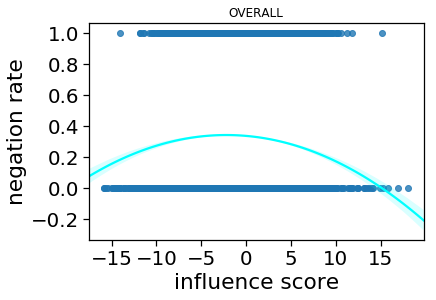

[-0.0011366 -0.0050207  0.3351366]


In [14]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, h='negation', label_restriction="correct_label_entailment")

In [15]:
NLI_influence_dir = "from_aws/NLI_negation_influence_output_bert_e3/"

In [16]:
mnli_processor = MnliProcessor()
hans_processor = HansProcessor()
train_examples = mnli_processor.get_train_examples('data/', 10000)
test_examples = hans_processor.get_neg_test_examples('data/')

9
The students saw the tourist that waited . The students did not see the tourist .
prediction: non-entailment , answer: non-entailment


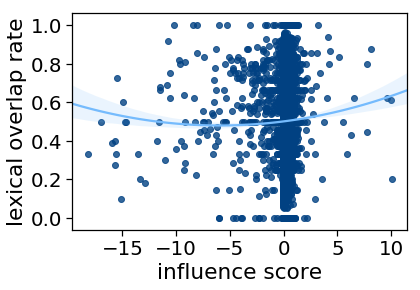

[0.00060331 0.00718031 0.50104488]
7
Important athletes arrived . Athletes did not arrive .
prediction: non-entailment , answer: non-entailment


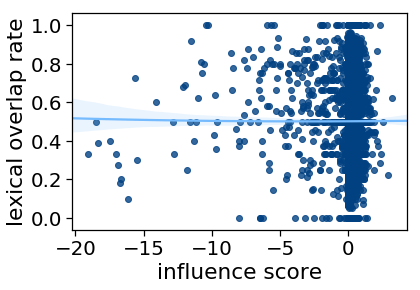

[5.51625850e-05 3.47605651e-04 5.01593025e-01]
6
The students and the secretaries mentioned the doctor . The secretaries did not mention the doctor .
prediction: non-entailment , answer: non-entailment


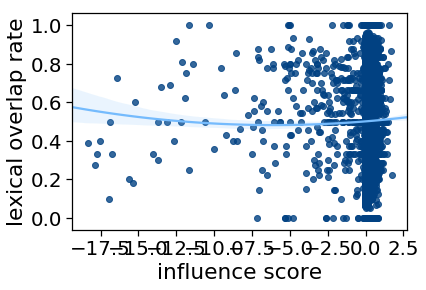

[0.0005272  0.00639199 0.50112098]
3
The actors who thanked the students admired the secretaries . The actors did not admire the secretaries .
prediction: non-entailment , answer: non-entailment


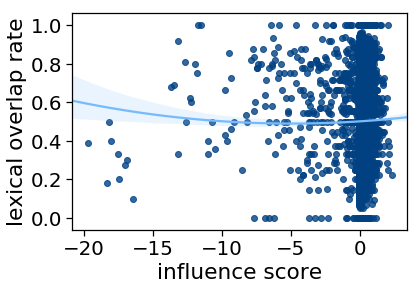

[4.69011181e-04 4.63290729e-03 5.01179177e-01]
10
The lawyers saw the professor behind the bankers . The lawyers did not see the professor .
prediction: non-entailment , answer: non-entailment


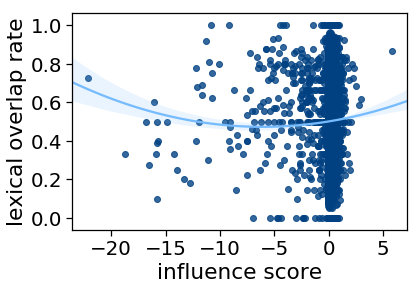

[0.00075962 0.00926575 0.50088857]
4
The actors recognized the lawyer and the professor . The actors did not recognize the professor .
prediction: non-entailment , answer: non-entailment


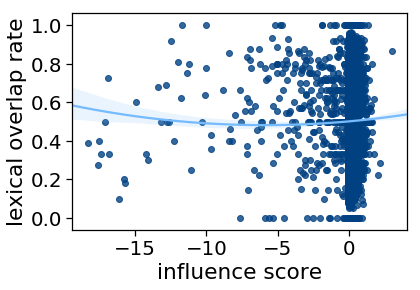

[0.00056202 0.00663412 0.50108617]
5
The manager was encouraged by the secretary . The secretary did not encourage the manager .
prediction: non-entailment , answer: non-entailment


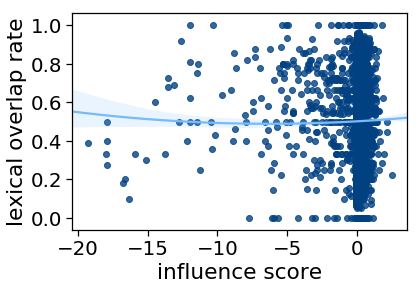

[3.20672371e-04 4.04602215e-03 5.01327516e-01]
14
The bankers called the student , and the presidents recommended the secretaries . The presidents did not recommend the secretaries .
prediction: non-entailment , answer: non-entailment


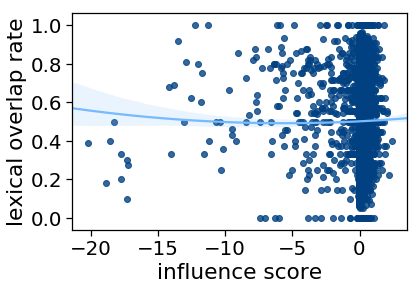

[3.12259010e-04 3.49380947e-03 5.01335929e-01]
2
The athlete by the doctors encouraged the senator . The athlete did not encourage the senator .
prediction: non-entailment , answer: non-entailment


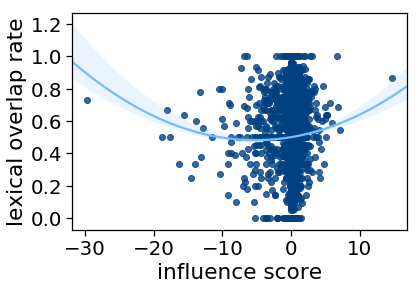

[0.00068367 0.00716166 0.50096452]
1
The tourist who the banker contacted called the lawyers . The banker did not contact the tourist .
prediction: non-entailment , answer: non-entailment


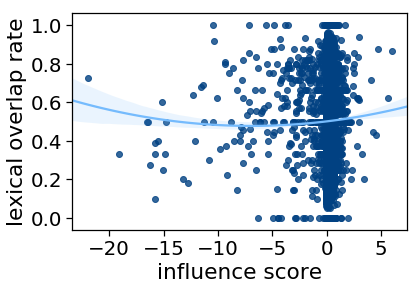

[4.91300284e-04 6.82062519e-03 5.01156888e-01]
8
The lawyer won the tournament . The lawyer did not win .
prediction: non-entailment , answer: non-entailment


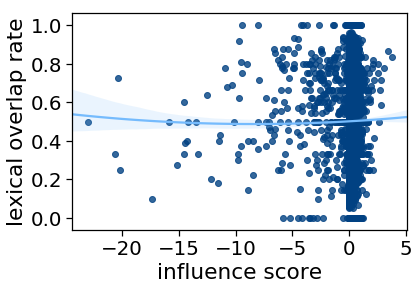

[2.00005242e-04 3.37074344e-03 5.01448183e-01]
11
While the scientists saw the tourists , the artist resigned . The scientists did not see the tourists .
prediction: non-entailment , answer: non-entailment


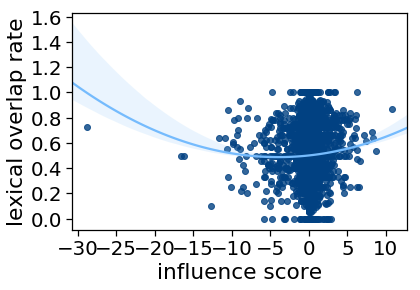

[0.00082735 0.00661908 0.50082084]
15
Definitely the artists mentioned the professor . The artists did not mention the professor .
prediction: non-entailment , answer: non-entailment


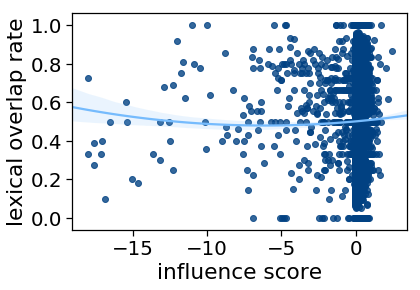

[0.00057495 0.00704325 0.50107324]
12
Since the author introduced the actors , the senators called the tourists . The senators did not call the tourists .
prediction: non-entailment , answer: non-entailment


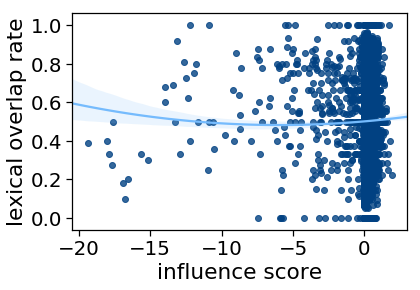

[0.00053677 0.00640524 0.50111142]
13
The athlete remembered that the artist introduced the doctor . The artist did not introduce the doctor .
prediction: non-entailment , answer: non-entailment


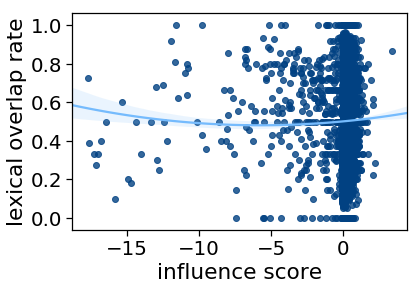

[0.00061362 0.007056   0.50103457]


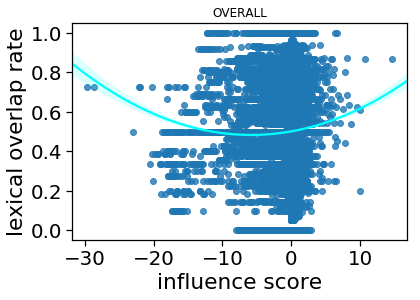

[0.00053349 0.00622604 0.5011147 ]


In [17]:
heuristic_effect_analysis(NLI_influence_dir, test_examples)

9
The students saw the tourist that waited . The students did not see the tourist .
prediction: non-entailment , answer: non-entailment


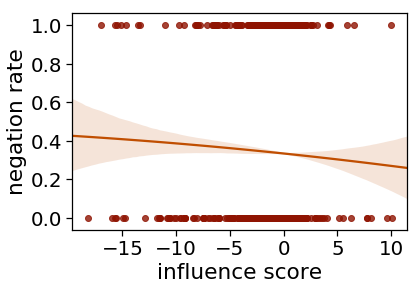

[-5.98725141e-05 -5.85382895e-03  3.34059873e-01]
7
Important athletes arrived . Athletes did not arrive .
prediction: non-entailment , answer: non-entailment


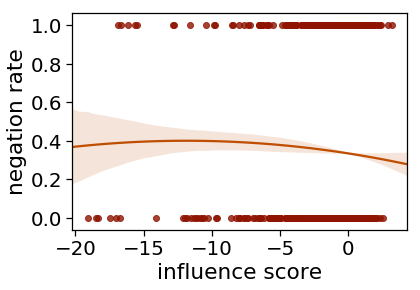

[-0.00046599 -0.01107867  0.33446599]
6
The students and the secretaries mentioned the doctor . The secretaries did not mention the doctor .
prediction: non-entailment , answer: non-entailment


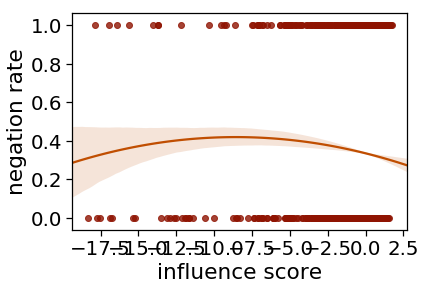

[-0.00114656 -0.01965216  0.33514656]
3
The actors who thanked the students admired the secretaries . The actors did not admire the secretaries .
prediction: non-entailment , answer: non-entailment


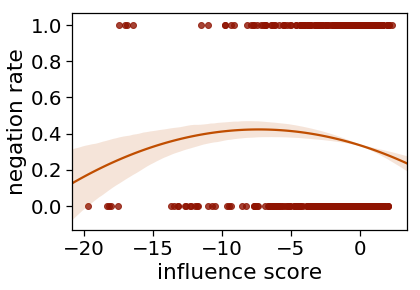

[-0.00162442 -0.02378495  0.33562442]
10
The lawyers saw the professor behind the bankers . The lawyers did not see the professor .
prediction: non-entailment , answer: non-entailment


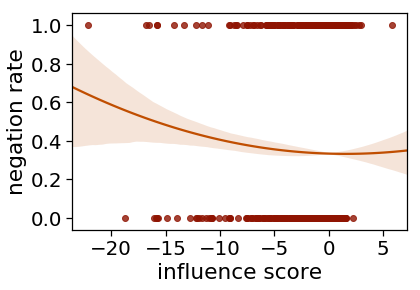

[ 0.00055133 -0.00169114  0.33344867]
4
The actors recognized the lawyer and the professor . The actors did not recognize the professor .
prediction: non-entailment , answer: non-entailment


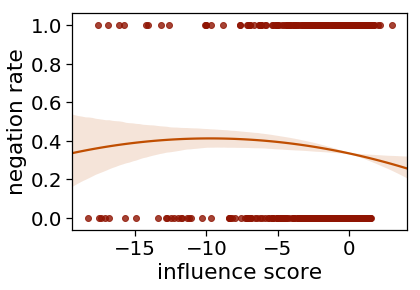

[-0.00081768 -0.01593671  0.33481768]
5
The manager was encouraged by the secretary . The secretary did not encourage the manager .
prediction: non-entailment , answer: non-entailment


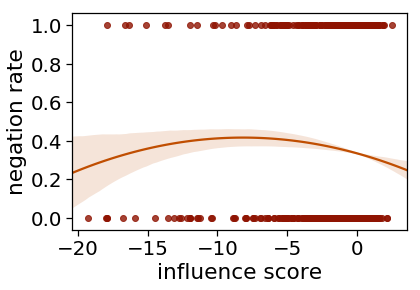

[-0.00122354 -0.0199755   0.33522354]
14
The bankers called the student , and the presidents recommended the secretaries . The presidents did not recommend the secretaries .
prediction: non-entailment , answer: non-entailment


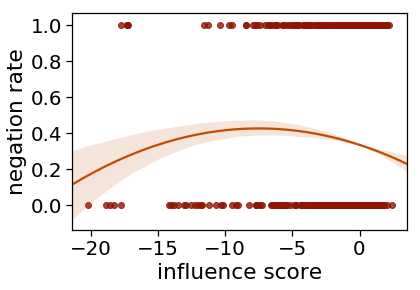

[-0.0016148  -0.02427518  0.3356148 ]
2
The athlete by the doctors encouraged the senator . The athlete did not encourage the senator .
prediction: non-entailment , answer: non-entailment


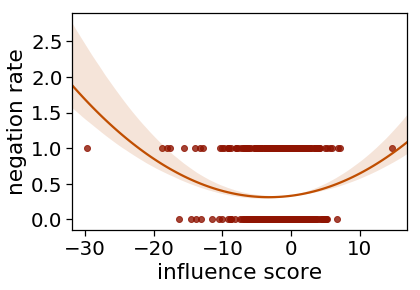

[0.00191361 0.01232793 0.33208639]
1
The tourist who the banker contacted called the lawyers . The banker did not contact the tourist .
prediction: non-entailment , answer: non-entailment


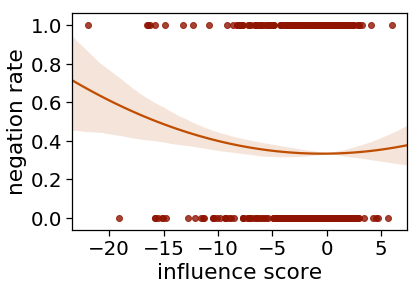

[0.00072262 0.0005998  0.33327738]
8
The lawyer won the tournament . The lawyer did not win .
prediction: non-entailment , answer: non-entailment


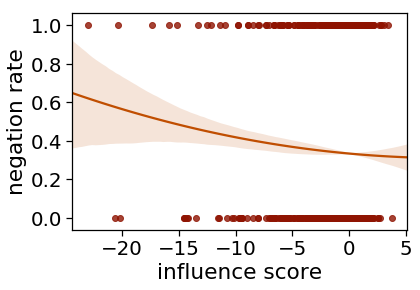

[ 3.09351308e-04 -5.39776431e-03  3.33690649e-01]
11
While the scientists saw the tourists , the artist resigned . The scientists did not see the tourists .
prediction: non-entailment , answer: non-entailment


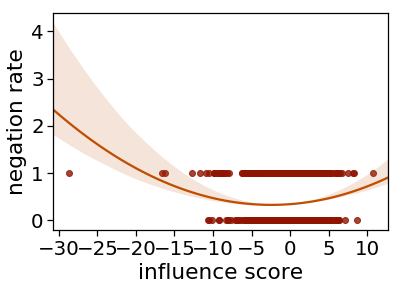

[0.0025292  0.01234491 0.3314708 ]
15
Definitely the artists mentioned the professor . The artists did not mention the professor .
prediction: non-entailment , answer: non-entailment


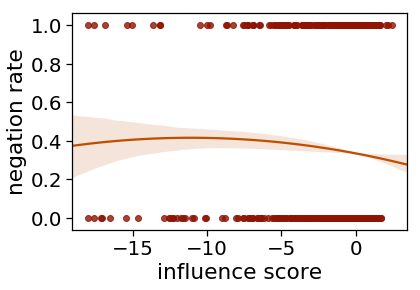

[-0.00066101 -0.01464856  0.33466101]
12
Since the author introduced the actors , the senators called the tourists . The senators did not call the tourists .
prediction: non-entailment , answer: non-entailment


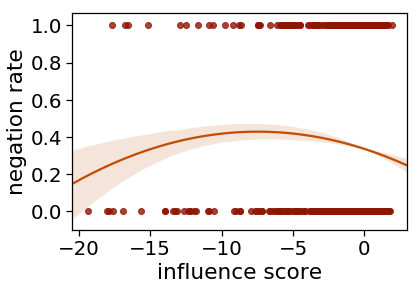

[-0.00166253 -0.02481857  0.33566253]
13
The athlete remembered that the artist introduced the doctor . The artist did not introduce the doctor .
prediction: non-entailment , answer: non-entailment


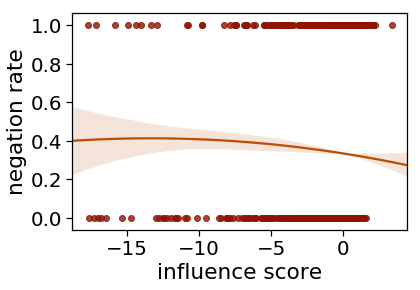

[-0.0004394  -0.01174942  0.3344394 ]


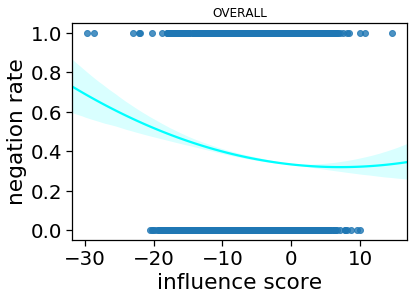

[ 2.68541233e-04 -3.83142875e-03  3.33731459e-01]


In [18]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, h='negation')

In [19]:
NLI_influence_dir = "from_aws/NLI_natural_influence_output_bert_e3/"

In [20]:
mnli_processor = MnliProcessor()
hans_processor = HansProcessor()
train_examples = mnli_processor.get_train_examples('data/', 10000)
test_examples = mnli_processor.get_dev_examples('data/')

30
i'm not opposed to it but when its when the time is right it will probably just kind of happen you know I cannot wait for it to happen.
prediction: non-entailment , answer: non-entailment


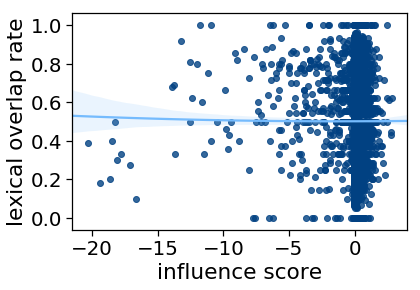

[6.99264298e-05 1.75873314e-04 5.01578262e-01]
9
If that investor were willing to pay extra for the security of limited downside, she could buy put options with a strike price of $98, which would lock in her profit on the shares at $18, less whatever the options cost. THe strike price could be $8.
prediction: non-entailment , answer: non-entailment


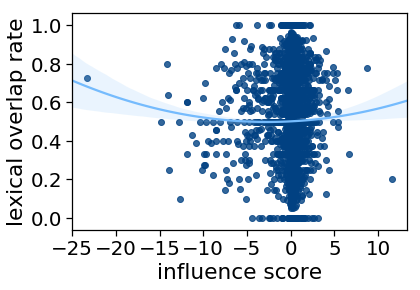

[4.32196561e-04 2.31686062e-03 5.01215991e-01]
28
The tourist industry continued to expand, and though it became one of the top two income earners in Spain, a realization that unrestricted mass tourism was leading to damaging long-term consequences also began to grow. Tourism is not very big in Spain.
prediction: non-entailment , answer: non-entailment


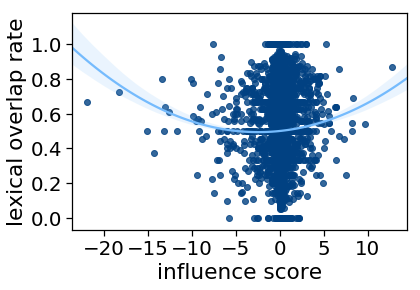

[0.00107949 0.00529497 0.50056869]
7
yeah i know and i did that all through college and it worked too I did that all through college but it never worked 
prediction: non-entailment , answer: non-entailment


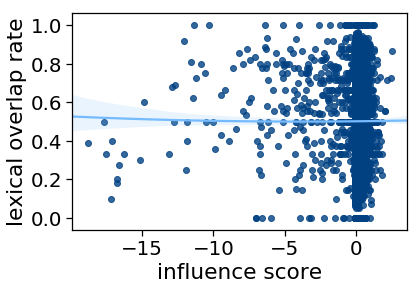

[1.01869681e-04 7.84982288e-04 5.01546318e-01]
43
While it's probably true that democracies are unlikely to go to war unless they're attacked, sometimes they are the first to take the offensive. Democracies probably won't go to war unless someone attacks them on their soil
prediction: non-entailment , answer: entailment


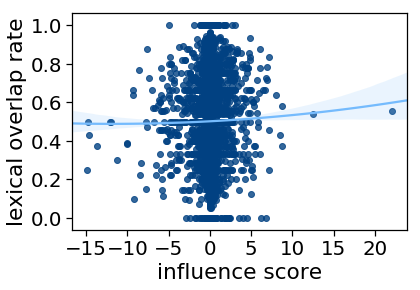

[9.60367635e-05 2.26729126e-03 5.01552151e-01]
36
The vineyards hug the gentle slopes between the Vosges and the Rhine Valley along a single narrow 120-km (75-mile) strip that stretches from Marlenheim, just west of Strasbourg, down to Thann, outside Mulhouse. The slopes between the Vosges and Rhine Valley are the only place appropriate for vineyards.
prediction: non-entailment , answer: non-entailment


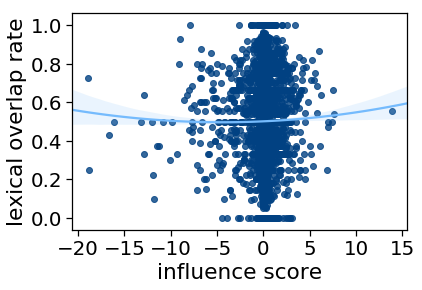

[2.47011515e-04 2.19458969e-03 5.01401176e-01]
22
Buffet and a  la carte available. It has a buffet.
prediction: entailment , answer: entailment


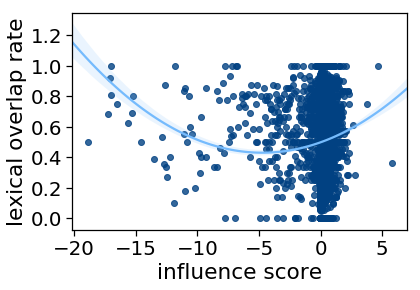

[0.00304876 0.02889959 0.49859943]
6
well that would be a help i wish they would do that here we have got so little landfill space left that we're going to run out before the end of this decade and it's really going to be We have plenty of space in the landfill.
prediction: non-entailment , answer: non-entailment


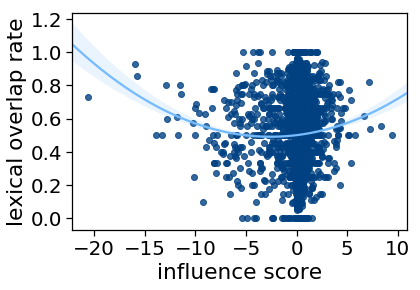

[0.00145186 0.007488   0.50019633]
3
uh i don't know i i have mixed emotions about him uh sometimes i like him but at the same times i love to see somebody beat him I like him for the most part, but would still enjoy seeing someone beat him.
prediction: entailment , answer: entailment


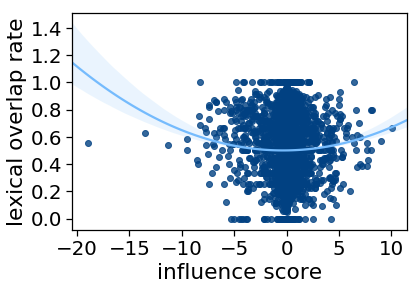

[0.0015932  0.00107796 0.50005498]
37
We did not study the reasons for these deviations specifically, but they likely result from the context in which federal CIOs operate. These deviations mostly involve failure to apply software updates in a timely manner.
prediction: non-entailment , answer: non-entailment


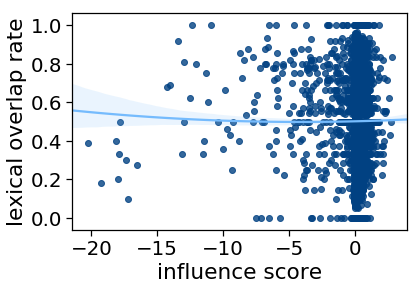

[1.99429172e-04 1.63769112e-03 5.01448759e-01]
10
3)  Dare you rise to the occasion, like Raskolnikov, and reject the petty rules that govern lesser men? Would you rise up and defeaat all evil lords in the town?
prediction: non-entailment , answer: non-entailment


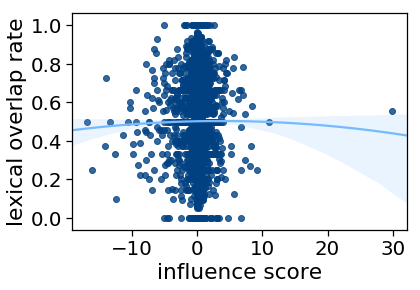

[-9.21644243e-05  6.67627817e-04  5.01740352e-01]
33
Conversely, an increase in government saving adds to the supply of resources available for investment and may put downward pressure on interest rates. Interest rates should increase to increase saving.
prediction: non-entailment , answer: non-entailment


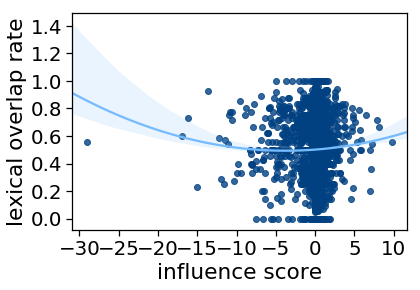

[0.00056907 0.00428771 0.50107912]
4
yeah i i think my favorite restaurant is always been the one closest  you know the closest as long as it's it meets the minimum criteria you know of good food My favorite restaurants are always at least a hundred miles away from my house. 
prediction: non-entailment , answer: non-entailment


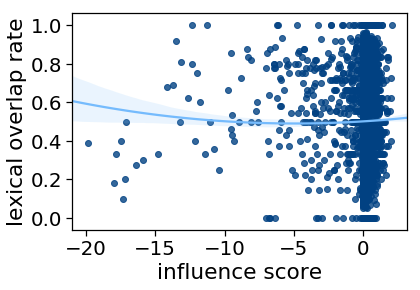

[4.54107654e-04 4.48785550e-03 5.01194080e-01]
32
Mortifyingly enough, it is all  the difficulty, the laziness, the pathetic formlessness in youth, the round peg in the square hole, the whatever do you want? Many youth are lazy.
prediction: non-entailment , answer: entailment


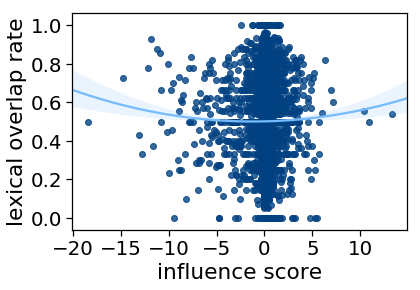

[4.63863483e-04 1.13007442e-03 5.01184325e-01]
26
Sorry but that's how it is. This is how things are and there are no apologies about it.
prediction: non-entailment , answer: non-entailment


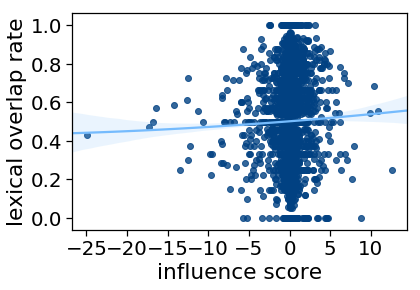

[3.73169449e-05 3.32398727e-03 5.01610871e-01]
5
i don't know um do you do a lot of camping I know exactly.
prediction: non-entailment , answer: non-entailment


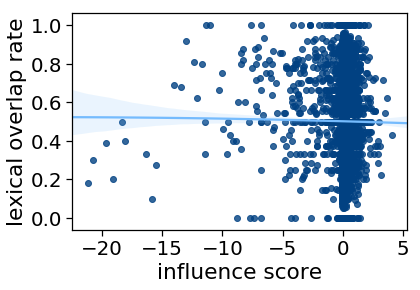

[-3.37528144e-05 -1.70119374e-03  5.01681941e-01]
39
Table 2: Examples of BLM's, FHWA's, IRS's, and VBA's Customer Satisfaction Expectations for Senior Executive Performance Senior Executive's have been studies on various aspects to reach the expectations.
prediction: entailment , answer: entailment


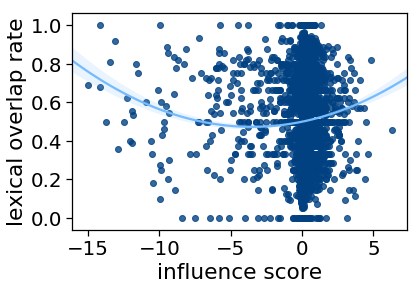

[0.00217342 0.0152749  0.49947477]
17
so i have to find a way to supplement that I need a way to add something extra.
prediction: non-entailment , answer: entailment


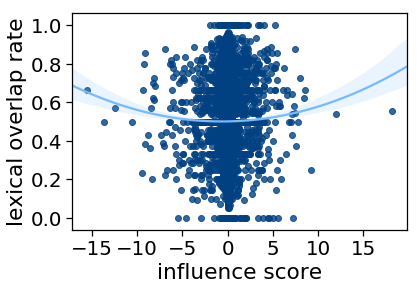

[0.00068262 0.00086874 0.50096556]
14
You and your friends are not welcome here, said Severn. Severn said the people were not welcome there.
prediction: entailment , answer: entailment


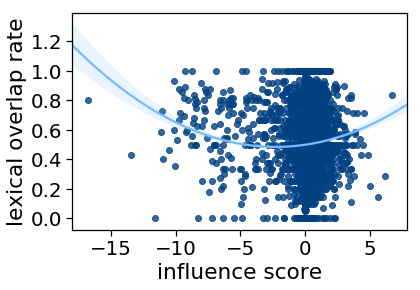

[0.00278256 0.01264713 0.49886563]
18
the hologram makes up all these things and uh i mean sometimes  sometimes it's funny sometimes it's not but uh you know it's something to pass the time until we do and then and then we watch football Sometimes it is amusing to see what the hologram creates.
prediction: entailment , answer: entailment


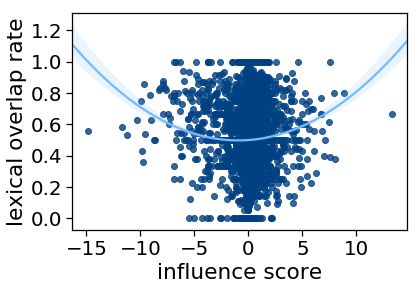

[0.00259494 0.0049173  0.49905325]
16
i'm not sure what the overnight low was I don't know how cold it got last night.
prediction: non-entailment , answer: entailment


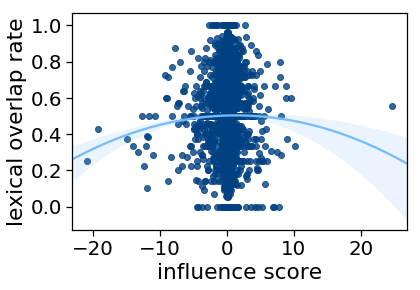

[-4.06192561e-04  1.06151322e-03  5.02054381e-01]
40
In Hong Kong you can have a plate, or even a whole dinner service, hand-painted to your own design. It's impossible to have a plate hand-painted to your own design in Hong Kong.
prediction: non-entailment , answer: non-entailment


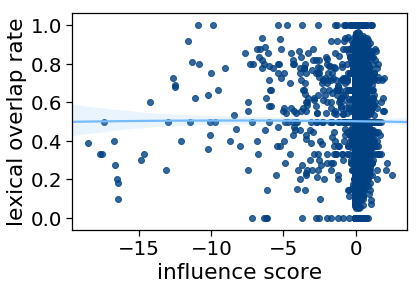

[-5.42129153e-05 -9.15764810e-04  5.01702401e-01]
2
This site includes a list of all award winners and a searchable database of Government Executive articles. The Government Executive articles housed on the website are not able to be searched.
prediction: non-entailment , answer: non-entailment


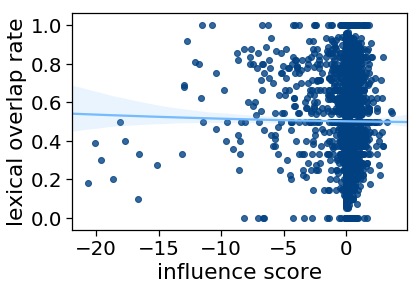

[ 3.79303085e-05 -9.71112378e-04  5.01610258e-01]
1
The new rights are nice enough Everyone really likes the newest benefits 
prediction: non-entailment , answer: non-entailment


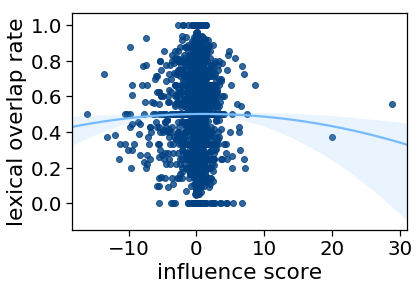

[-1.93244983e-04  4.27915063e-04  5.01841433e-01]
49
'Publicity.' Lincoln removed his great hat, making a small show of dusting it off. Lincoln took his hat off.
prediction: entailment , answer: entailment


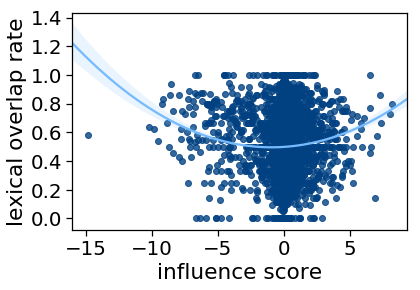

[0.00319543 0.00591831 0.49845275]
8
Calcutta seems to be the only other production center having any pretensions to artistic creativity at all, but ironically you're actually more likely to see the works of Satyajit Ray or Mrinal Sen shown in Europe or North America than in India itself. Most of Mrinal Sen's work can be found in European collections.
prediction: non-entailment , answer: non-entailment


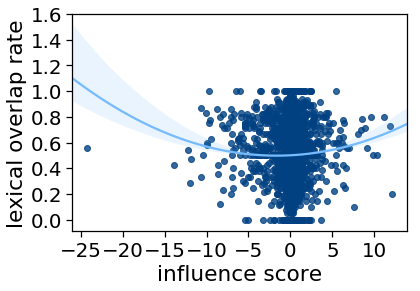

[0.00101694 0.00338491 0.50063125]
34
Britain's best-selling tabloid, the Sun , announced as a front-page world exclusive Friday that Texan model Jerry Hall has started divorce proceedings against aging rock star Mick Jagger at the High Court in London. There is a British publication called the Sun.
prediction: entailment , answer: entailment


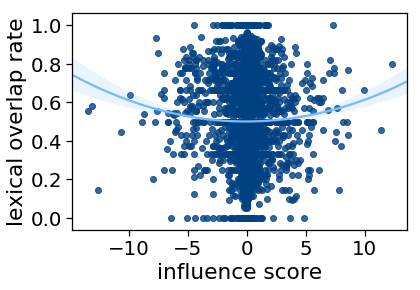

[1.11408602e-03 1.35334343e-04 5.00534102e-01]
11
The most important directions are simply up and up leads eventually to the cathedral and fortress commanding the hilltop, and down inevitably leads to one of three gates through the wall to the new town. Go downwards to one of the gates, all of which will lead you into the cathedral.
prediction: entailment , answer: non-entailment


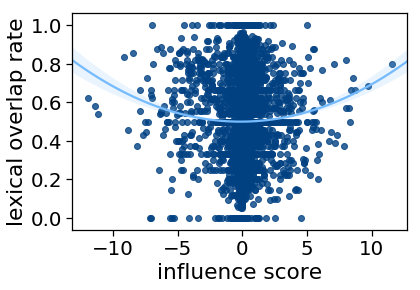

[0.00188581 0.00051213 0.49976238]
15
um-hum um-hum yeah well uh i can see you know it's it's it's it's kind of funny because we it seems like we loan money you know we money with strings attached and if the government changes and the country that we loan the money to um i can see why the might have a different attitude towards paying it back it's a lot us that  you know we don't really loan money to to countries we loan money to governments and it's the We don't loan a lot of money.
prediction: non-entailment , answer: non-entailment


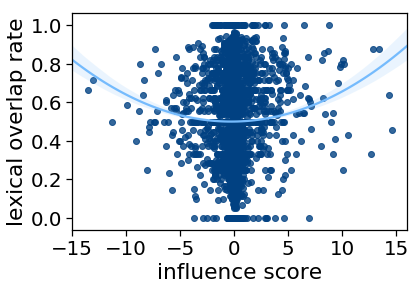

[0.00148546 0.00085149 0.50016273]
19
5 The share of gross national saving used to replace depreciated capital has increased over the past 40 years. Gross national saving was highest this year.
prediction: non-entailment , answer: non-entailment


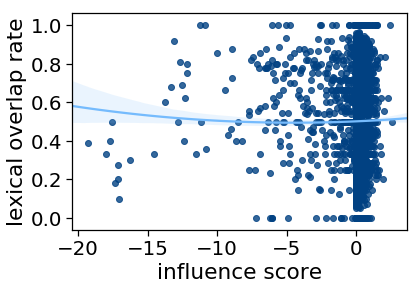

[3.44204150e-04 3.11867508e-03 5.01303984e-01]
23
Blue says Blumenthal claimed Clinton had told him that Lewinsky had made unwanted sexual advances. Clinton said that Monica Lewinsky made unwanted sexual advances during her time as a journalist in the White House. 
prediction: non-entailment , answer: non-entailment


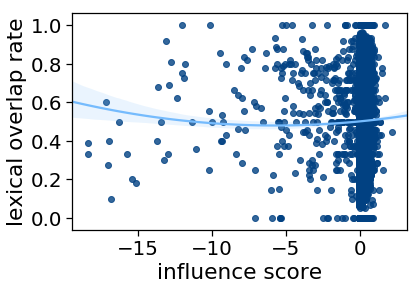

[0.00065619 0.0074923  0.50099199]
41
There are a number of expensive jewelry and other duty-free shops, all with goods priced in US dollars (duty-free goods must always be paid for in foreign currency). Jewelry and duty-free shops are an interesting place to buy goods.
prediction: non-entailment , answer: non-entailment


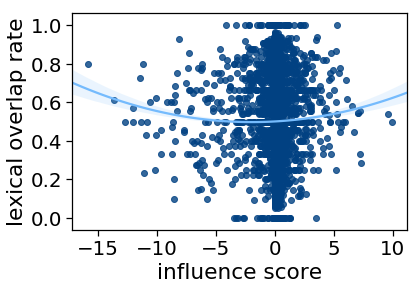

[0.00088323 0.00345924 0.50076496]
48
and uh as a matter of fact he's a draft dodger They dodged the draft, I'll have you know.
prediction: non-entailment , answer: entailment


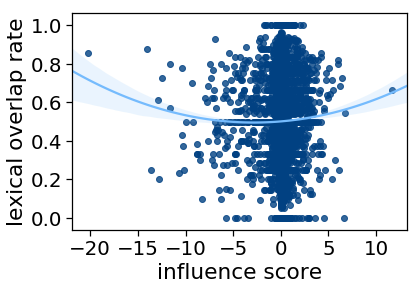

[0.0007377  0.00417061 0.50091049]
12
The bhakti movement of the Tamils brought a new warmth to the hitherto rigid Brahmanic ritual of Hinduism. The Tamils' bhakti movement froze the previously warm ritual of Hinduism.
prediction: non-entailment , answer: non-entailment


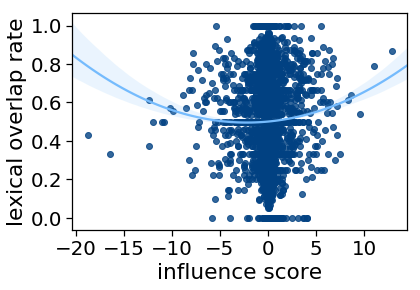

[0.0010711  0.00470231 0.50057708]
29
She seemed so different  " She had changed a lot since the last time we'd seen her.
prediction: non-entailment , answer: non-entailment


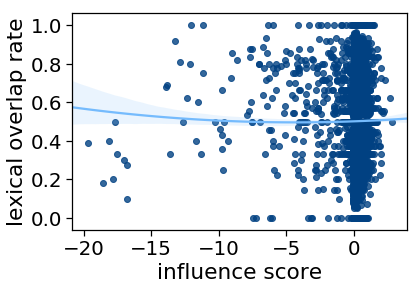

[2.88693234e-04 2.51350310e-03 5.01359495e-01]
47
But you have to have money to save it, and not many couples with young children have the luxury of tucking away $2,000 apiece annually for their Golden Years. Not many couples with kids can save up for retirement.
prediction: entailment , answer: entailment


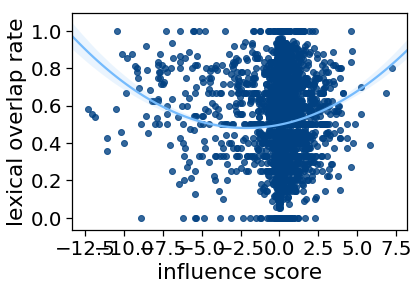

[0.00388472 0.01636137 0.49776347]
21
you want to punch the button and go You don't want to push the button lightly, but rather punch it hard.
prediction: non-entailment , answer: non-entailment


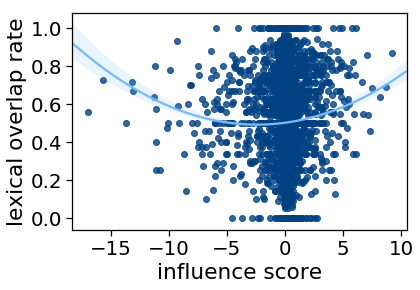

[0.00169671 0.00815132 0.49995148]
45
yeah i mean just when uh the they military paid for her education The military didn't pay for her education.
prediction: non-entailment , answer: non-entailment


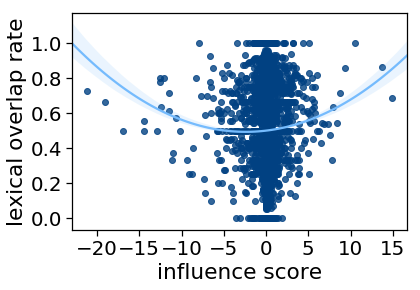

[0.00120031 0.00576212 0.50044788]
42
What's truly striking, though, is that Jobs has never really let this idea go. Jobs never held onto an idea for long.
prediction: entailment , answer: non-entailment


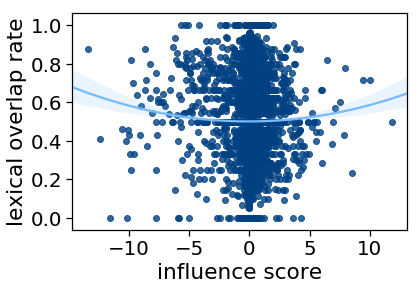

[8.33066690e-04 1.68322807e-04 5.00815121e-01]
27
Not quite as large is the Papal Crose commemorating Pope John Paul II's visit in 1979, when more than one million people gathered to celebrate mass. Pope John Paul II also visited in 1983.
prediction: non-entailment , answer: non-entailment


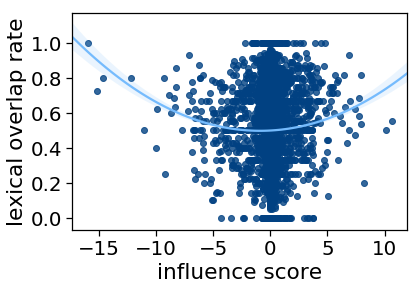

[0.00197978 0.00354432 0.49966841]
31
The census of 1931 served as an alarm signal for the Malay national consciousness. The 1931 Malay census was an alarm bell.
prediction: entailment , answer: entailment


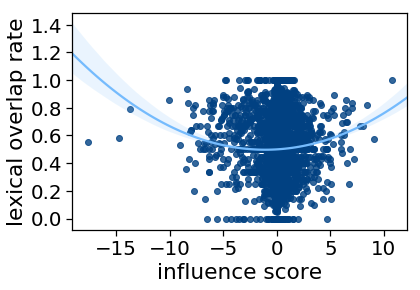

[0.0021414  0.00470873 0.49950679]
50
In the stock market, however, the damage can get much worse. The stock market can experience much worse damage. 
prediction: entailment , answer: entailment


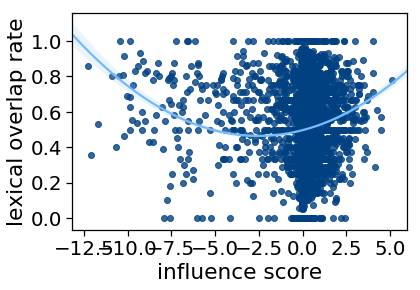

[0.00508233 0.02578578 0.49656586]
46
but uh these guys were actually on the road uh two thousand miles from from home when they had to file their uh their final exams and send them in These men filed their midterm exams from home. 
prediction: non-entailment , answer: non-entailment


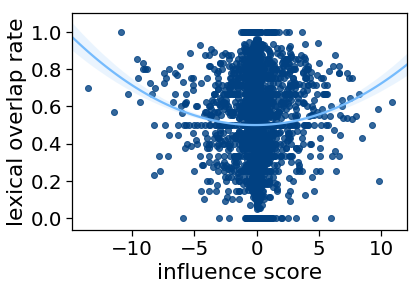

[0.0021897  0.00049991 0.49945849]
38
Rouen is the ancient center of Normandy's thriving textile industry, and the place of Joan of Arc's martyrdom ' a national symbol of resistance to tyranny. Joan of Arc sacrificed her life at Rouen, which became an enduring symbol of opposition to tyranny.
prediction: entailment , answer: entailment


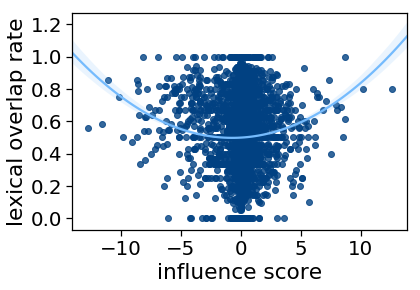

[0.00295954 0.00430794 0.49868865]
13
see now in a situation like that the boys are only sixteen years old and they were sexually involved with her and i think like at that particular point she was twenty three you know so she wasn't really that much older than them and being a boy at that age i think that they're very um you know let's face it that's at a point in your life when you you're just starting to realize all the things of life Everyone involved was the same age.
prediction: non-entailment , answer: non-entailment


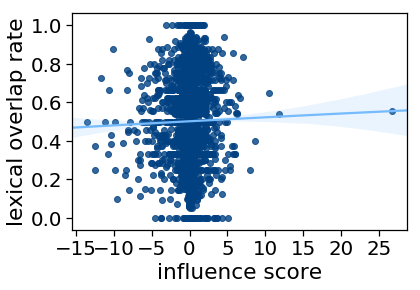

[-4.23414194e-06  2.09622980e-03  5.01652422e-01]
25
oh uh-huh well no they wouldn't would they no No, they wouldn't go there.
prediction: entailment , answer: non-entailment


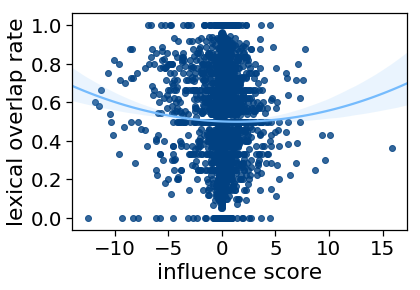

[ 0.0007908  -0.00221261  0.50085739]
44
But to you, who know the truth, I propose to read certain passages which will throw some light on the extraordinary mentality of this great man." He opened the book, and turned the thin pages. There is no information on the mentality of the man, extraordinary or not, contained within the thin-paged book. 
prediction: non-entailment , answer: non-entailment


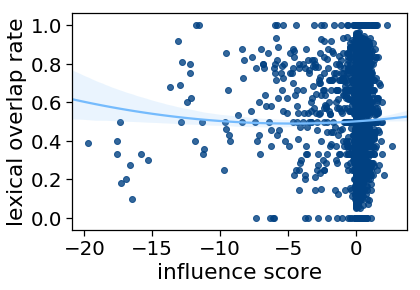

[4.88447136e-04 4.69890755e-03 5.01159741e-01]
20
So far, however, the number of mail pieces lost to alternative bill-paying methods is too small to have any material impact on First-Class volume. The amount of lost mail is huge and really impacts mail volume
prediction: non-entailment , answer: non-entailment


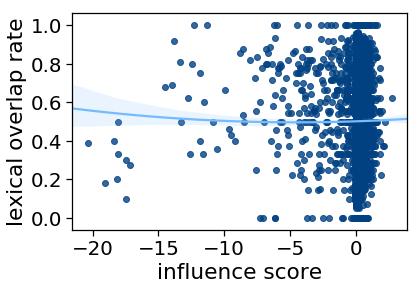

[2.50519108e-04 2.28043905e-03 5.01397669e-01]
35
He was of two minds, one reveled in the peace of this village. He loved how peaceful the village was.
prediction: entailment , answer: entailment


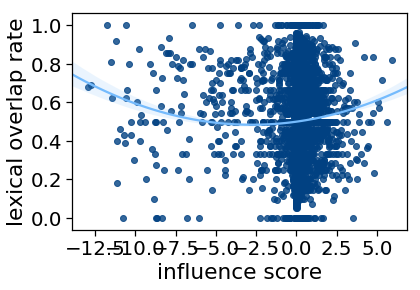

[0.00210699 0.01163568 0.4995412 ]
24
We also have found that leading organizations strive to ensure that their core processes efficiently and effectively support mission-related outcomes. Leading organizations want to be sure their employees are safe.
prediction: non-entailment , answer: non-entailment


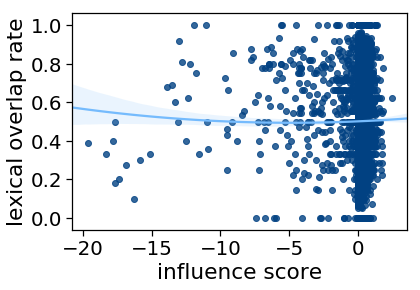

[3.15724450e-04 3.08222055e-03 5.01332464e-01]


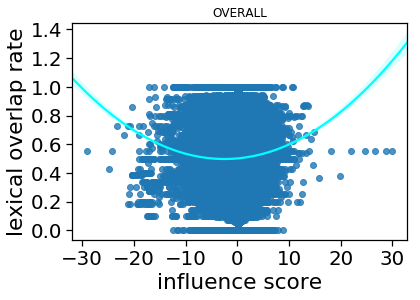

[0.00065111 0.00323452 0.50099708]


In [21]:
heuristic_effect_analysis(NLI_influence_dir, test_examples)

30
i'm not opposed to it but when its when the time is right it will probably just kind of happen you know I cannot wait for it to happen.
prediction: non-entailment , answer: non-entailment


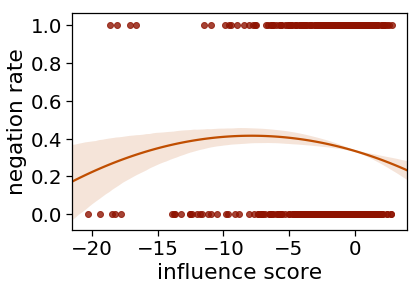

[-0.00130038 -0.02043383  0.33530038]
9
If that investor were willing to pay extra for the security of limited downside, she could buy put options with a strike price of $98, which would lock in her profit on the shares at $18, less whatever the options cost. THe strike price could be $8.
prediction: non-entailment , answer: non-entailment


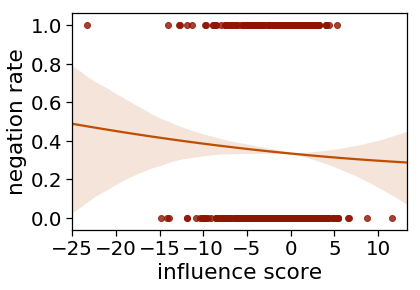

[ 7.02967807e-05 -4.43643931e-03  3.33929703e-01]
28
The tourist industry continued to expand, and though it became one of the top two income earners in Spain, a realization that unrestricted mass tourism was leading to damaging long-term consequences also began to grow. Tourism is not very big in Spain.
prediction: non-entailment , answer: non-entailment


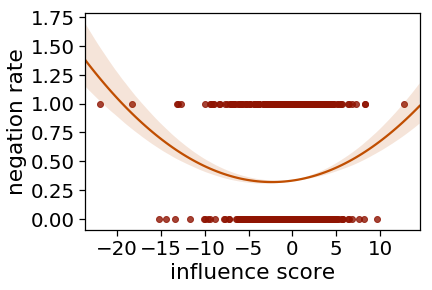

[0.00233484 0.01084288 0.33166516]
7
yeah i know and i did that all through college and it worked too I did that all through college but it never worked 
prediction: non-entailment , answer: non-entailment


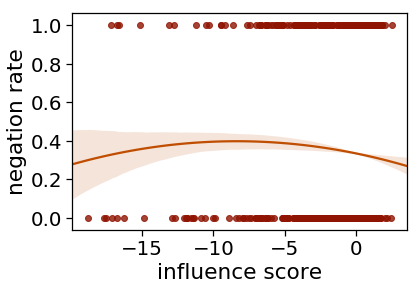

[-0.00089888 -0.0150448   0.33489888]
43
While it's probably true that democracies are unlikely to go to war unless they're attacked, sometimes they are the first to take the offensive. Democracies probably won't go to war unless someone attacks them on their soil
prediction: non-entailment , answer: entailment


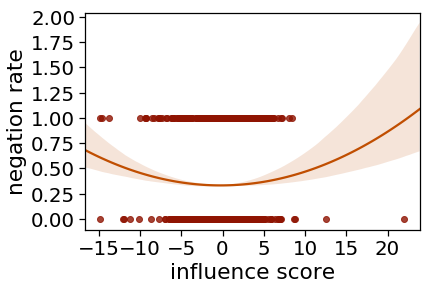

[0.00129801 0.00061282 0.33270199]
36
The vineyards hug the gentle slopes between the Vosges and the Rhine Valley along a single narrow 120-km (75-mile) strip that stretches from Marlenheim, just west of Strasbourg, down to Thann, outside Mulhouse. The slopes between the Vosges and Rhine Valley are the only place appropriate for vineyards.
prediction: non-entailment , answer: non-entailment


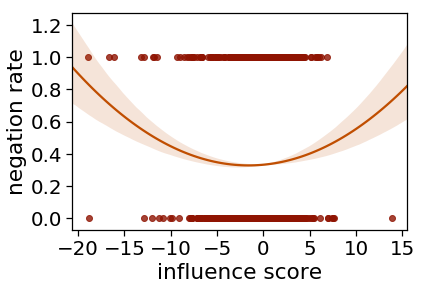

[0.00168651 0.00538809 0.33231349]
22
Buffet and a  la carte available. It has a buffet.
prediction: entailment , answer: entailment


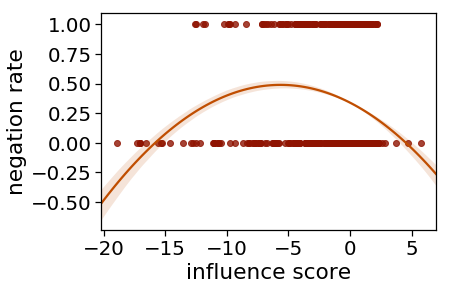

[-0.0047296  -0.05325941  0.3387296 ]
6
well that would be a help i wish they would do that here we have got so little landfill space left that we're going to run out before the end of this decade and it's really going to be We have plenty of space in the landfill.
prediction: non-entailment , answer: non-entailment


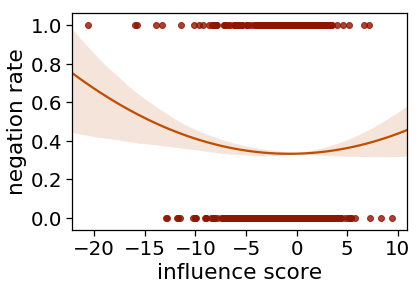

[0.00091268 0.00132227 0.33308732]
3
uh i don't know i i have mixed emotions about him uh sometimes i like him but at the same times i love to see somebody beat him I like him for the most part, but would still enjoy seeing someone beat him.
prediction: entailment , answer: entailment


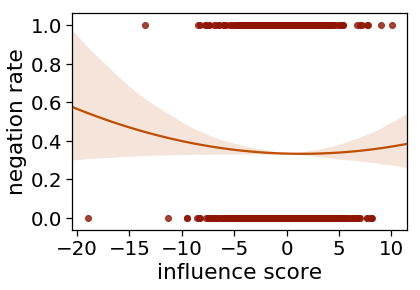

[ 0.00050915 -0.00144496  0.33349085]
37
We did not study the reasons for these deviations specifically, but they likely result from the context in which federal CIOs operate. These deviations mostly involve failure to apply software updates in a timely manner.
prediction: non-entailment , answer: non-entailment


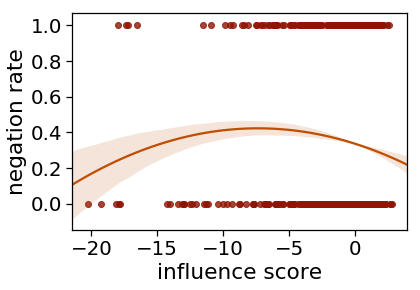

[-0.00159215 -0.02343716  0.33559215]
10
3)  Dare you rise to the occasion, like Raskolnikov, and reject the petty rules that govern lesser men? Would you rise up and defeaat all evil lords in the town?
prediction: non-entailment , answer: non-entailment


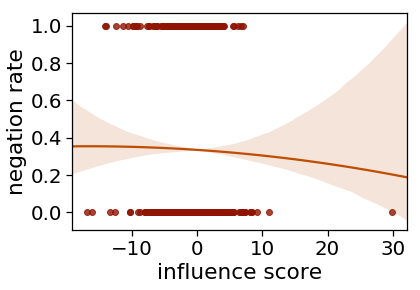

[-6.94507436e-05 -2.32519655e-03  3.34069451e-01]
33
Conversely, an increase in government saving adds to the supply of resources available for investment and may put downward pressure on interest rates. Interest rates should increase to increase saving.
prediction: non-entailment , answer: non-entailment


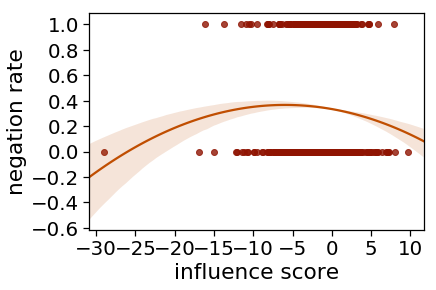

[-0.00091539 -0.0109064   0.33491539]
4
yeah i i think my favorite restaurant is always been the one closest  you know the closest as long as it's it meets the minimum criteria you know of good food My favorite restaurants are always at least a hundred miles away from my house. 
prediction: non-entailment , answer: non-entailment


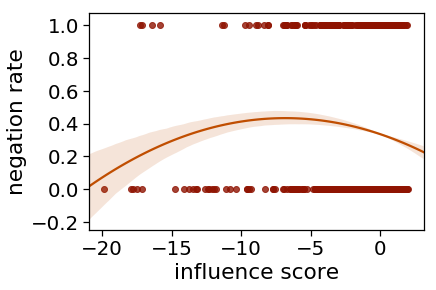

[-0.0020814  -0.02843095  0.3360814 ]
32
Mortifyingly enough, it is all  the difficulty, the laziness, the pathetic formlessness in youth, the round peg in the square hole, the whatever do you want? Many youth are lazy.
prediction: non-entailment , answer: entailment


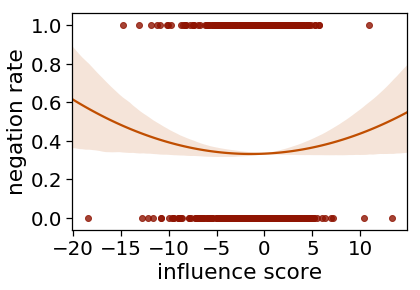

[0.00081808 0.00227089 0.33318192]
26
Sorry but that's how it is. This is how things are and there are no apologies about it.
prediction: non-entailment , answer: non-entailment


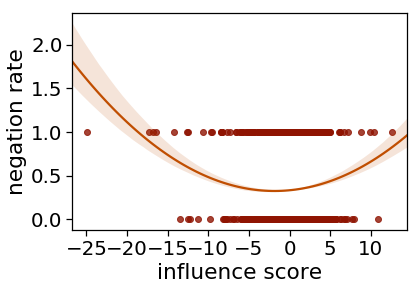

[0.00239399 0.0088954  0.33160601]
5
i don't know um do you do a lot of camping I know exactly.
prediction: non-entailment , answer: non-entailment


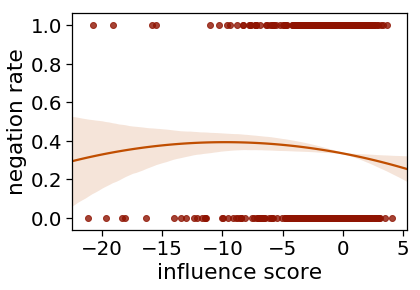

[-0.00061196 -0.0119527   0.33461196]
39
Table 2: Examples of BLM's, FHWA's, IRS's, and VBA's Customer Satisfaction Expectations for Senior Executive Performance Senior Executive's have been studies on various aspects to reach the expectations.
prediction: entailment , answer: entailment


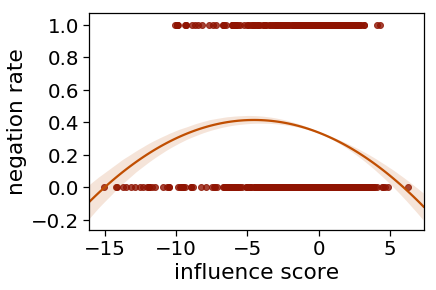

[-0.00377964 -0.03425636  0.33777964]
17
so i have to find a way to supplement that I need a way to add something extra.
prediction: non-entailment , answer: entailment


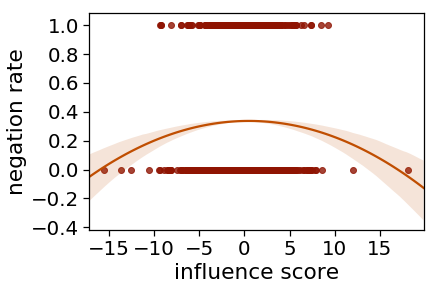

[-0.00123994  0.00125598  0.33523994]
14
You and your friends are not welcome here, said Severn. Severn said the people were not welcome there.
prediction: entailment , answer: entailment


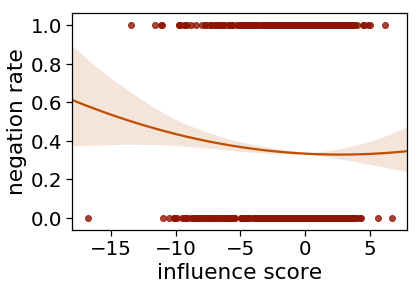

[ 0.00066041 -0.00358745  0.33333959]
18
the hologram makes up all these things and uh i mean sometimes  sometimes it's funny sometimes it's not but uh you know it's something to pass the time until we do and then and then we watch football Sometimes it is amusing to see what the hologram creates.
prediction: entailment , answer: entailment


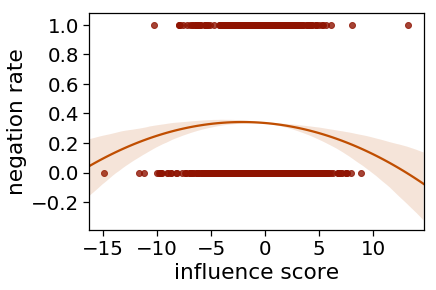

[-0.00148485 -0.00625142  0.33548485]
16
i'm not sure what the overnight low was I don't know how cold it got last night.
prediction: non-entailment , answer: entailment


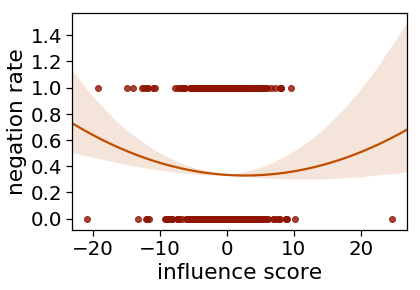

[ 0.00059756 -0.00321453  0.33340244]
40
In Hong Kong you can have a plate, or even a whole dinner service, hand-painted to your own design. It's impossible to have a plate hand-painted to your own design in Hong Kong.
prediction: non-entailment , answer: non-entailment


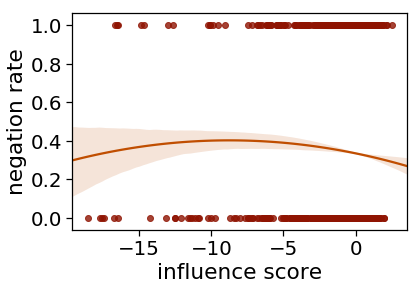

[-0.00087971 -0.01541412  0.33487971]
2
This site includes a list of all award winners and a searchable database of Government Executive articles. The Government Executive articles housed on the website are not able to be searched.
prediction: non-entailment , answer: non-entailment


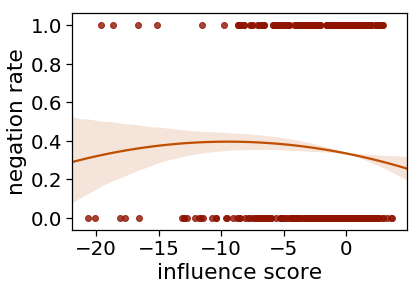

[-0.00068066 -0.01287426  0.33468066]
1
The new rights are nice enough Everyone really likes the newest benefits 
prediction: non-entailment , answer: non-entailment


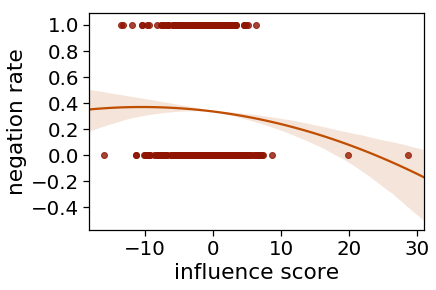

[-3.12055112e-04 -6.54020322e-03  3.34312055e-01]
49
'Publicity.' Lincoln removed his great hat, making a small show of dusting it off. Lincoln took his hat off.
prediction: entailment , answer: entailment


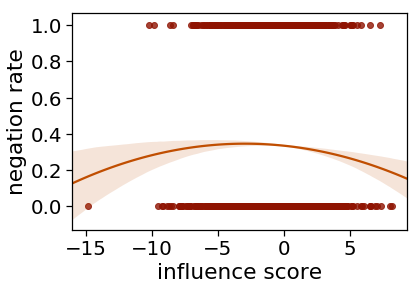

[-0.00128261 -0.00753736  0.33528261]
8
Calcutta seems to be the only other production center having any pretensions to artistic creativity at all, but ironically you're actually more likely to see the works of Satyajit Ray or Mrinal Sen shown in Europe or North America than in India itself. Most of Mrinal Sen's work can be found in European collections.
prediction: non-entailment , answer: non-entailment


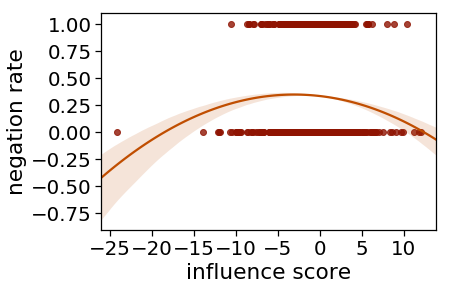

[-0.00145686 -0.00886394  0.33545686]
34
Britain's best-selling tabloid, the Sun , announced as a front-page world exclusive Friday that Texan model Jerry Hall has started divorce proceedings against aging rock star Mick Jagger at the High Court in London. There is a British publication called the Sun.
prediction: entailment , answer: entailment


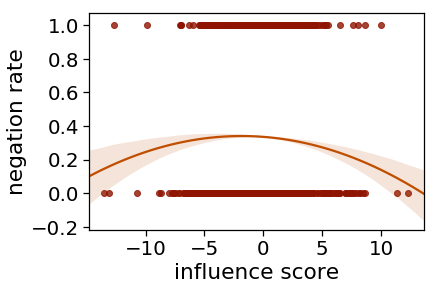

[-0.00143289 -0.00532794  0.33543289]
11
The most important directions are simply up and up leads eventually to the cathedral and fortress commanding the hilltop, and down inevitably leads to one of three gates through the wall to the new town. Go downwards to one of the gates, all of which will lead you into the cathedral.
prediction: entailment , answer: non-entailment


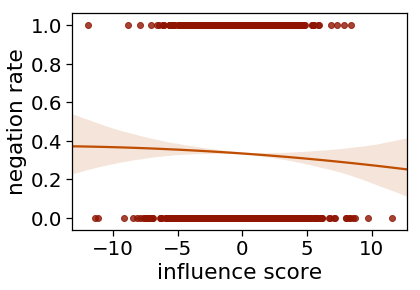

[-1.40873911e-04 -4.69433364e-03  3.34140874e-01]
15
um-hum um-hum yeah well uh i can see you know it's it's it's it's kind of funny because we it seems like we loan money you know we money with strings attached and if the government changes and the country that we loan the money to um i can see why the might have a different attitude towards paying it back it's a lot us that  you know we don't really loan money to to countries we loan money to governments and it's the We don't loan a lot of money.
prediction: non-entailment , answer: non-entailment


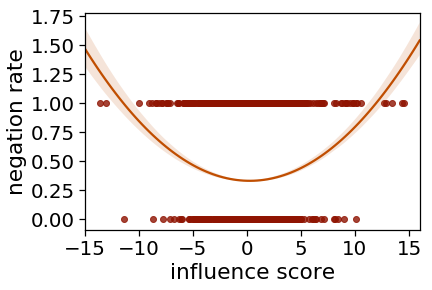

[ 0.00491285 -0.0026095   0.32908715]
19
5 The share of gross national saving used to replace depreciated capital has increased over the past 40 years. Gross national saving was highest this year.
prediction: non-entailment , answer: non-entailment


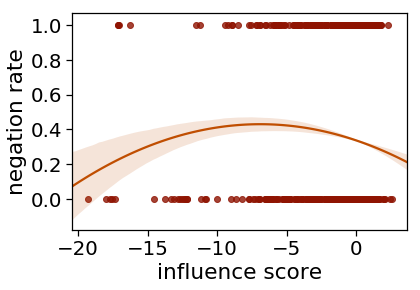

[-0.00195664 -0.02704336  0.33595664]
23
Blue says Blumenthal claimed Clinton had told him that Lewinsky had made unwanted sexual advances. Clinton said that Monica Lewinsky made unwanted sexual advances during her time as a journalist in the White House. 
prediction: non-entailment , answer: non-entailment


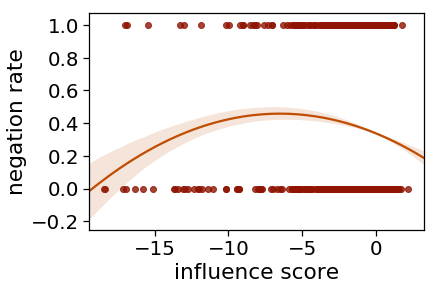

[-0.00284509 -0.03713847  0.33684509]
41
There are a number of expensive jewelry and other duty-free shops, all with goods priced in US dollars (duty-free goods must always be paid for in foreign currency). Jewelry and duty-free shops are an interesting place to buy goods.
prediction: non-entailment , answer: non-entailment


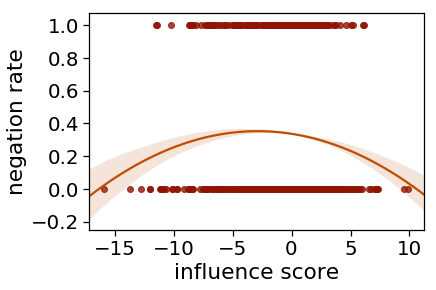

[-0.00194599 -0.01117223  0.33594599]
48
and uh as a matter of fact he's a draft dodger They dodged the draft, I'll have you know.
prediction: non-entailment , answer: entailment


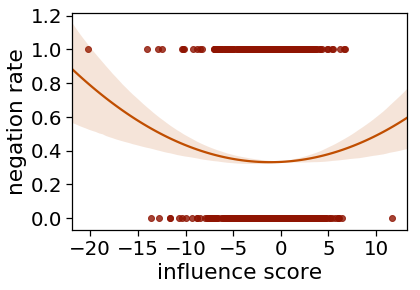

[0.00127484 0.0028233  0.33272516]
12
The bhakti movement of the Tamils brought a new warmth to the hitherto rigid Brahmanic ritual of Hinduism. The Tamils' bhakti movement froze the previously warm ritual of Hinduism.
prediction: non-entailment , answer: non-entailment


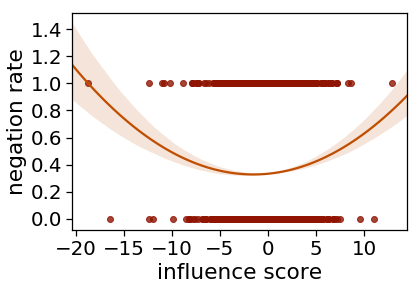

[0.00228684 0.00690614 0.33171316]
29
She seemed so different  " She had changed a lot since the last time we'd seen her.
prediction: non-entailment , answer: non-entailment


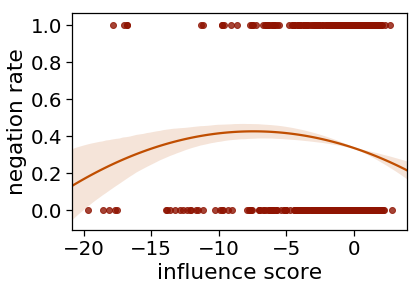

[-0.00163595 -0.02430651  0.33563595]
47
But you have to have money to save it, and not many couples with young children have the luxury of tucking away $2,000 apiece annually for their Golden Years. Not many couples with kids can save up for retirement.
prediction: entailment , answer: entailment


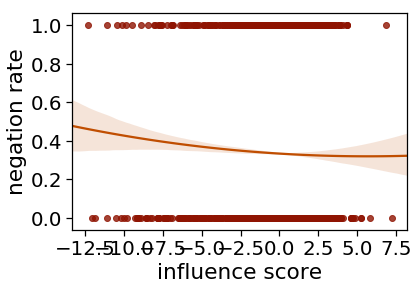

[ 0.00043606 -0.00495863  0.33356394]
21
you want to punch the button and go You don't want to push the button lightly, but rather punch it hard.
prediction: non-entailment , answer: non-entailment


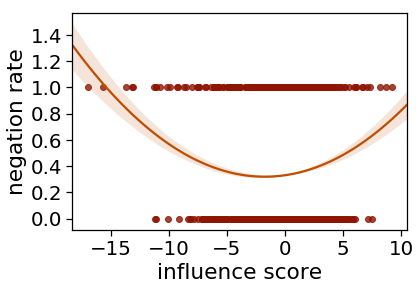

[0.00365612 0.01269938 0.33034388]
45
yeah i mean just when uh the they military paid for her education The military didn't pay for her education.
prediction: non-entailment , answer: non-entailment


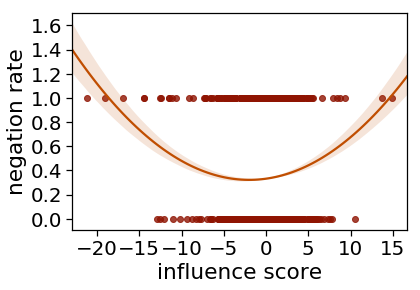

[0.00245525 0.00977494 0.33154475]
42
What's truly striking, though, is that Jobs has never really let this idea go. Jobs never held onto an idea for long.
prediction: entailment , answer: non-entailment


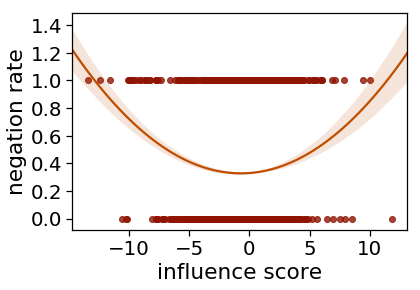

[0.00455006 0.00647078 0.32944994]
27
Not quite as large is the Papal Crose commemorating Pope John Paul II's visit in 1979, when more than one million people gathered to celebrate mass. Pope John Paul II also visited in 1983.
prediction: non-entailment , answer: non-entailment


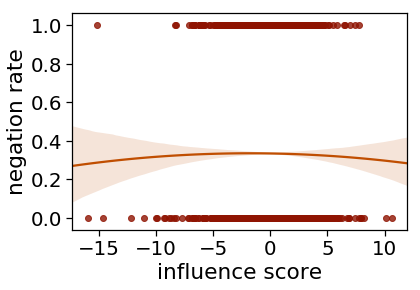

[-2.72666122e-04 -9.93766331e-04  3.34272666e-01]
31
The census of 1931 served as an alarm signal for the Malay national consciousness. The 1931 Malay census was an alarm bell.
prediction: entailment , answer: entailment


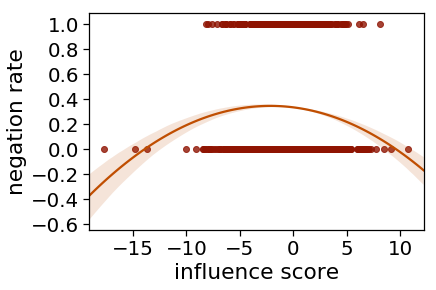

[-0.00251108 -0.01087763  0.33651108]
50
In the stock market, however, the damage can get much worse. The stock market can experience much worse damage. 
prediction: entailment , answer: entailment


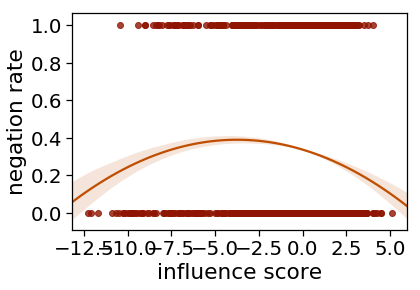

[-0.00374487 -0.02808642  0.33774487]
46
but uh these guys were actually on the road uh two thousand miles from from home when they had to file their uh their final exams and send them in These men filed their midterm exams from home. 
prediction: non-entailment , answer: non-entailment


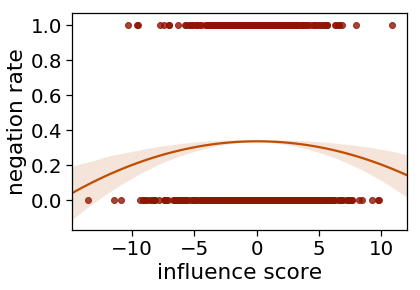

[-1.34160669e-03  1.07250475e-04  3.35341607e-01]
38
Rouen is the ancient center of Normandy's thriving textile industry, and the place of Joan of Arc's martyrdom ' a national symbol of resistance to tyranny. Joan of Arc sacrificed her life at Rouen, which became an enduring symbol of opposition to tyranny.
prediction: entailment , answer: entailment


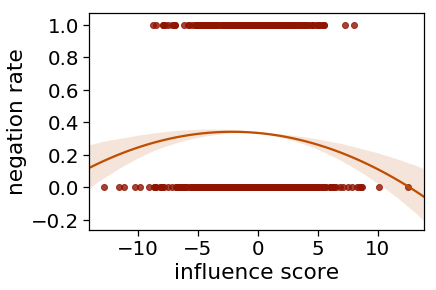

[-0.00156393 -0.00661937  0.33556393]
13
see now in a situation like that the boys are only sixteen years old and they were sexually involved with her and i think like at that particular point she was twenty three you know so she wasn't really that much older than them and being a boy at that age i think that they're very um you know let's face it that's at a point in your life when you you're just starting to realize all the things of life Everyone involved was the same age.
prediction: non-entailment , answer: non-entailment


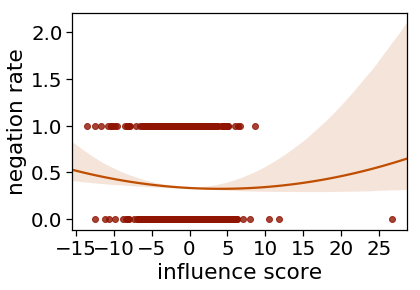

[ 0.00053594 -0.00435654  0.33346406]
25
oh uh-huh well no they wouldn't would they no No, they wouldn't go there.
prediction: entailment , answer: non-entailment


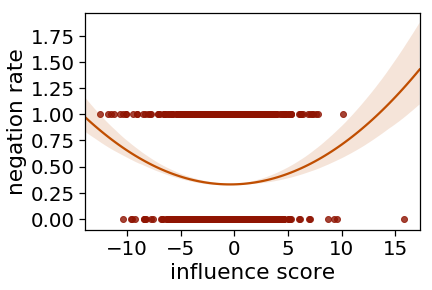

[0.00351178 0.00283244 0.33048822]
44
But to you, who know the truth, I propose to read certain passages which will throw some light on the extraordinary mentality of this great man." He opened the book, and turned the thin pages. There is no information on the mentality of the man, extraordinary or not, contained within the thin-paged book. 
prediction: non-entailment , answer: non-entailment


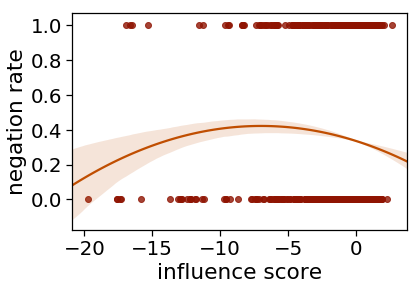

[-0.00176118 -0.02462701  0.33576118]
20
So far, however, the number of mail pieces lost to alternative bill-paying methods is too small to have any material impact on First-Class volume. The amount of lost mail is huge and really impacts mail volume
prediction: non-entailment , answer: non-entailment


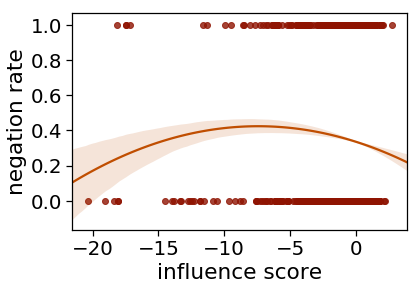

[-0.00160807 -0.02388025  0.33560807]
35
He was of two minds, one reveled in the peace of this village. He loved how peaceful the village was.
prediction: entailment , answer: entailment


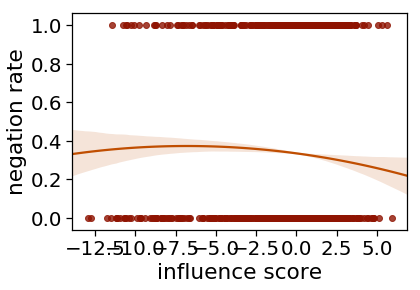

[-0.00082632 -0.01123215  0.33482632]
24
We also have found that leading organizations strive to ensure that their core processes efficiently and effectively support mission-related outcomes. Leading organizations want to be sure their employees are safe.
prediction: non-entailment , answer: non-entailment


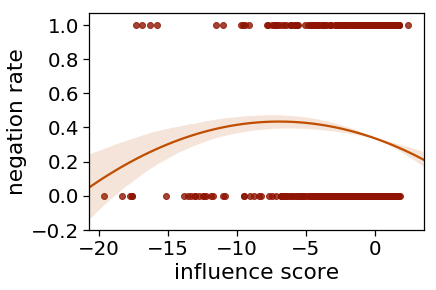

[-0.00203402 -0.02826525  0.33603402]


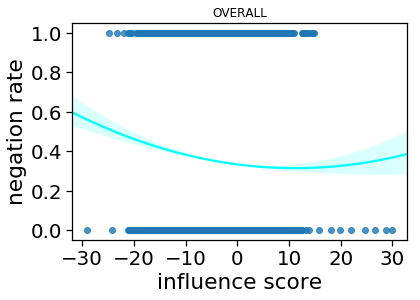

[ 1.51951535e-04 -3.39797077e-03  3.33848048e-01]


In [22]:
heuristic_effect_analysis(NLI_influence_dir, test_examples, h='negation')